In [1]:
library(Seurat)
library(dplyr)
library(ggplot2)
library(patchwork)
library(tibble)
library(qs)
library(ggplot2)
library(ggridges)
library(tidyr)
library(RColorBrewer)
library(readxl)
library(stringr)
library(ggpubr) 
library(viridis)
seed <- 123
set.seed(seed)
options(dplyr.summarise.inform = FALSE)
setwd("/home/a.garg/integration_project/step_14/11march_final")

Loading required package: SeuratObject

Loading required package: sp




Attaching package: ‘SeuratObject’


The following object is masked from ‘package:base’:

    intersect



Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


qs 0.25.6

Loading required package: viridisLite



In [ ]:
#sobj_new <- qread("/home/a.garg/integration_project/step_10/ROSMAP_edited_cell_type/Allfour_SCT_integration_layer_wdedited_cells.qs", nthreads = 6)
#sobj_new[["RNA"]] <- JoinLayers(sobj_new[["RNA"]])
#sobj_new <- SCTransform(sobj_new, assay = "RNA", verbose = TRUE) # runtime approx 2h
#qsave(sobj_new, "/home/a.garg/integration_project/step_14/Allfour_SCT_integration_layer_wdedited_cells_newanno_SCT.qs", nthreads = 6)

In [2]:
sobj_new <- qread("/home/a.garg/integration_project/step_14/Allfour_SCT_integration_layer_wdedited_cells_newanno_SCT.qs", nthreads = 6)

In [3]:
sobj_new_sub <- subset(sobj_new, subset = batch == "ROSMAP_MIT")

In [4]:
sobj_new_sub <- subset(sobj_new_sub, subset = Integrated_cell_type == "Homeostatic" | Integrated_cell_type =="Activated")

In [5]:
qual_col_pals <- brewer.pal.info[brewer.pal.info$category == "qual", ]
col_vector <- unlist(mapply(brewer.pal, qual_col_pals$maxcolors, rownames(qual_col_pals)))

In [6]:
p1 <- DimPlot(sobj_new, raster = "FALSE", reduction = "umap.cca", group.by = "Integrated_cell_type", alpha = 0.5, label = TRUE, pt.size = 0.5, label.size = 3, repel = TRUE, cols = col_vector[c(1:11, 14)], label.box = TRUE)


#sobj_new_sub
p2 <- DimPlot(sobj_new_sub, raster = "FALSE", reduction = "umap.cca", group.by = "Integrated_cell_type", alpha = 0.5, label = TRUE, pt.size = 0.5, label.size = 3, repel = TRUE, cols = col_vector[c(1:11, 14)], label.box = TRUE)


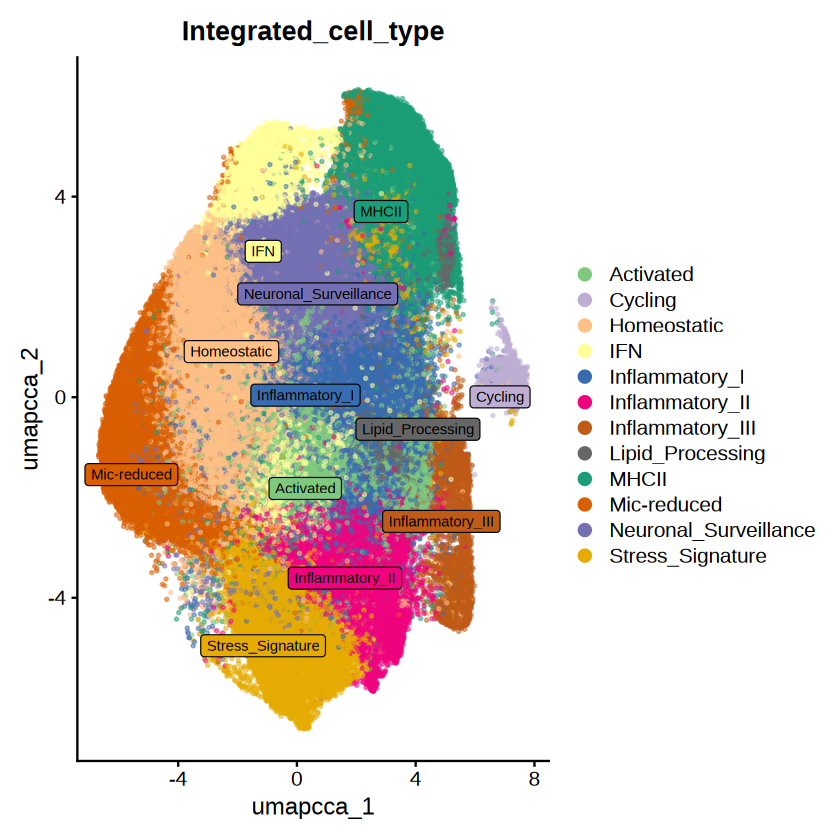

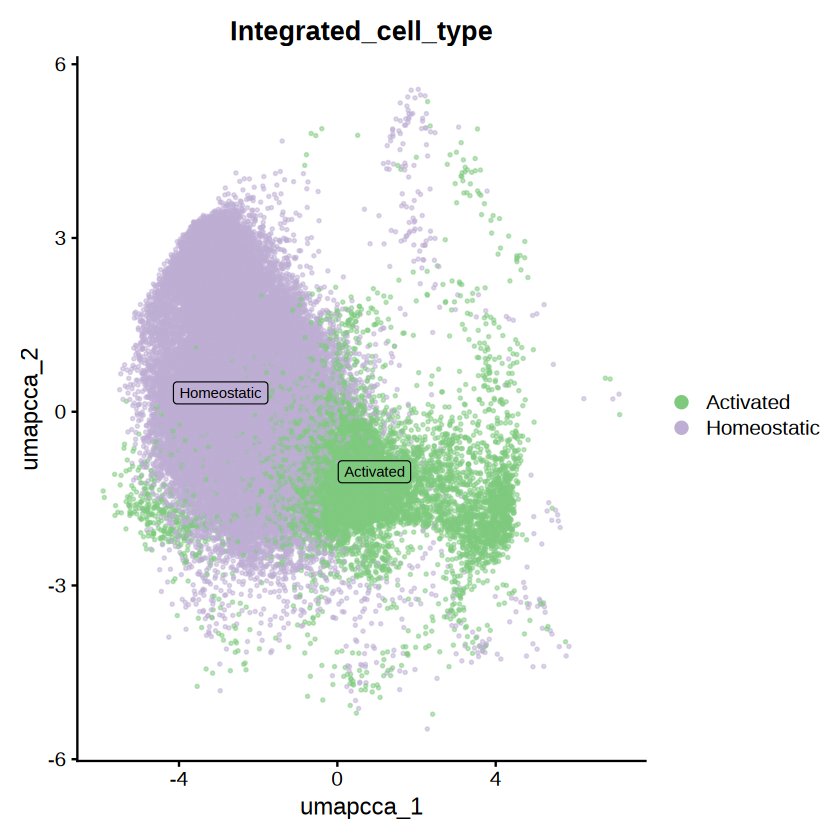

In [7]:
p1
p2

In [3]:
AD_before_annot <- readRDS(file = "/home/a.garg/integration_project/step_14/ADwithout_white_before_annot.rds")

In [10]:
   anchors <- FindTransferAnchors(reference = sobj_new_sub, query = AD_before_annot, normalization.method = "SCT", k.anchor = 10)
   predictions.assay <- TransferData(anchorset = anchors, refdata = sobj_new_sub$Integrated_cell_type, prediction.assay = TRUE, weight.reduction = AD_before_annot[["pca"]], dims = 1:15)
   AD_before_annot[["predictions"]] <- predictions.assay

Normalizing query using reference SCT model

Warning message:
“No layers found matching search pattern provided”
Performing PCA on the provided reference using 2963 features as input.

Projecting cell embeddings

Finding neighborhoods

Finding anchors

	Found 189 anchors

Finding integration vectors

Finding integration vector weights

Predicting cell labels



In [11]:
dir <- "/home/a.garg/integration_project/step_14/"
qsave(AD_before_annot, paste0(dir, "AD_afteranno_wd_Hom_activ_ROSMAP", ".qs"))

In [2]:
file <- qread("/home/a.garg/integration_project/step_14/AD_afteranno_wd_Hom_activ_ROSMAP.qs")

In [3]:
Idents(file) <- "layer_annotation"
file <- subset(file, idents = "Layer 1", invert = TRUE)

file$barcode <- colnames(file)
score_data <- as.data.frame(t(file@assays$predictions$data))
score_data$barcode <- rownames(score_data)

if (all(rownames(score_data) == colnames(file))) {
    data1 <- merge(x = file@meta.data, y = score_data)
}


Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”


with layer 2-6 labels

Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image


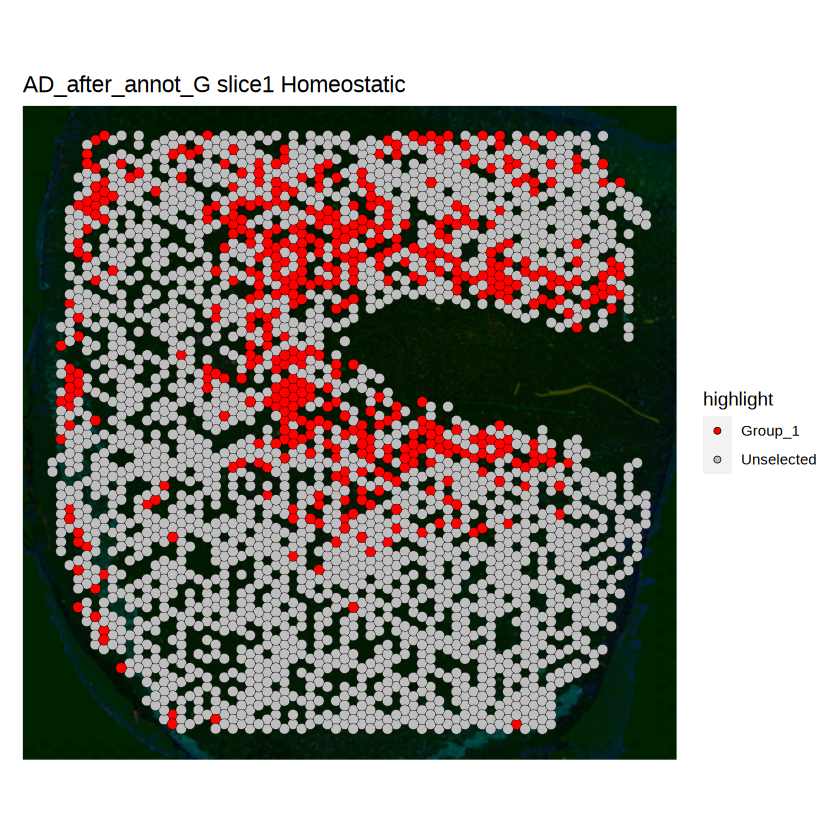

Saving 6.67 x 6.67 in image


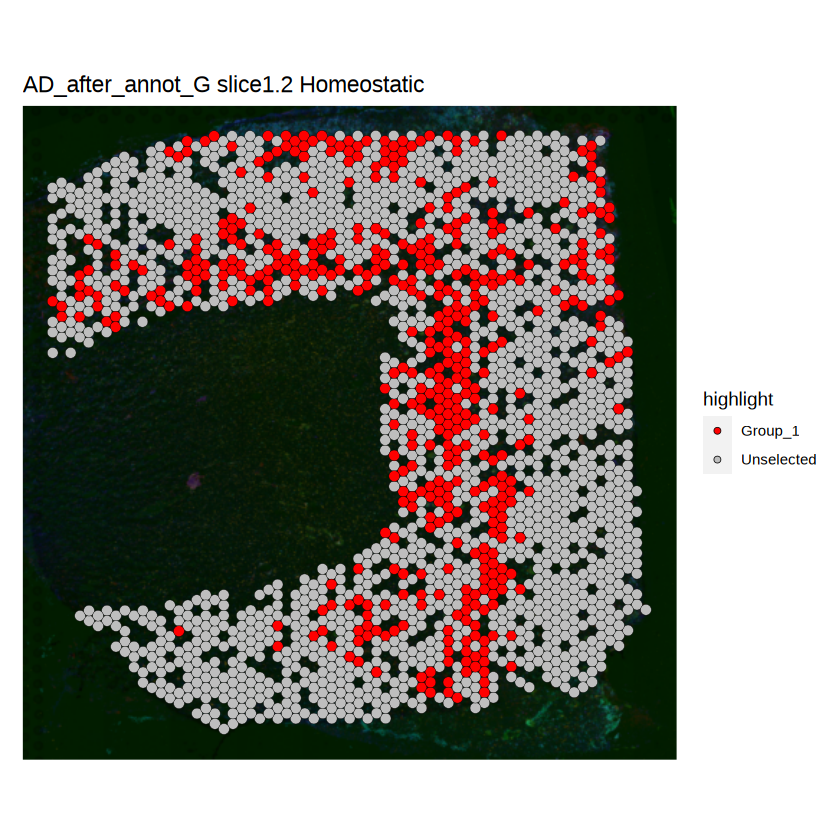

Saving 6.67 x 6.67 in image


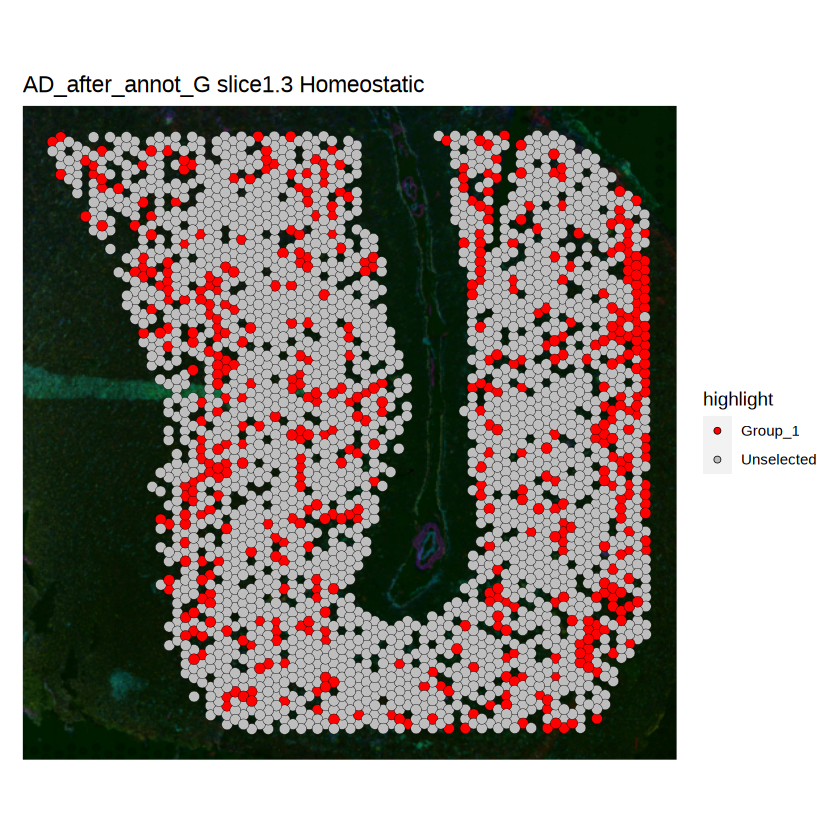

Saving 6.67 x 6.67 in image


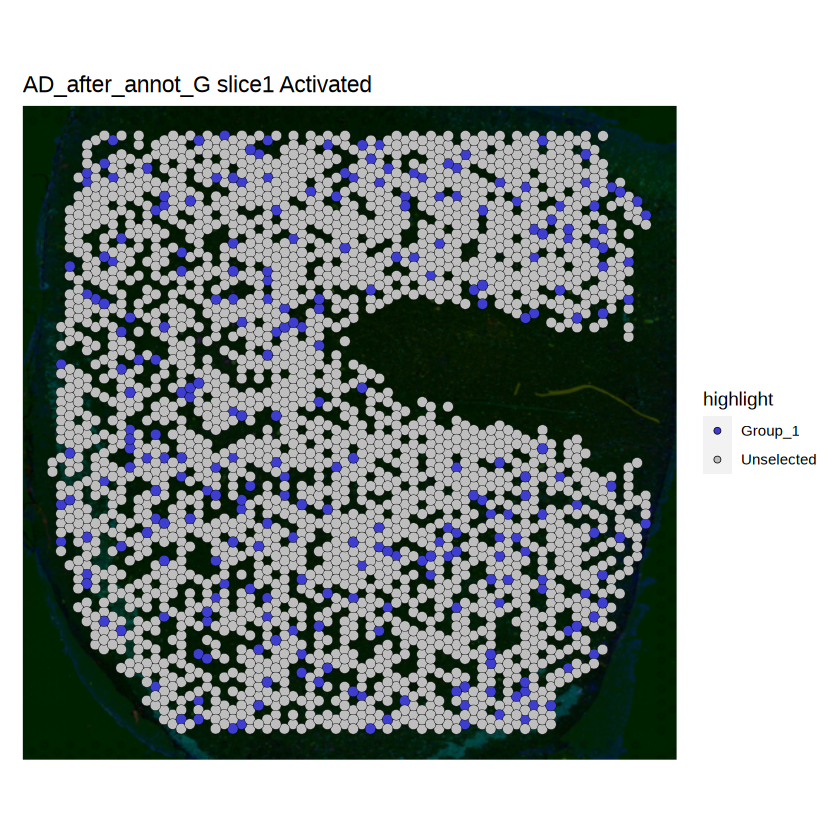

Saving 6.67 x 6.67 in image


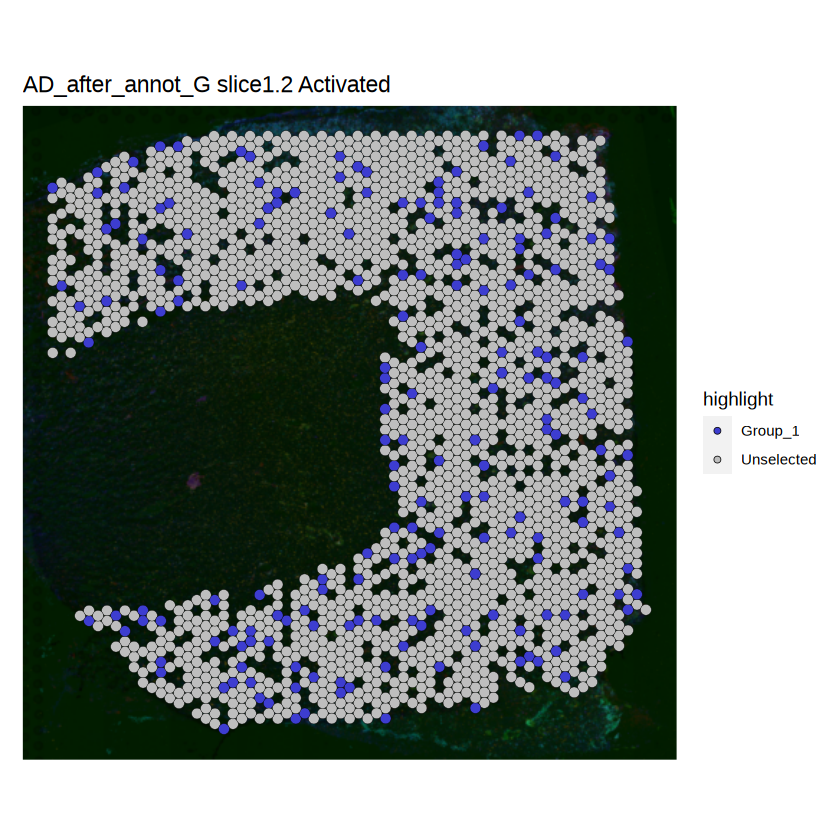

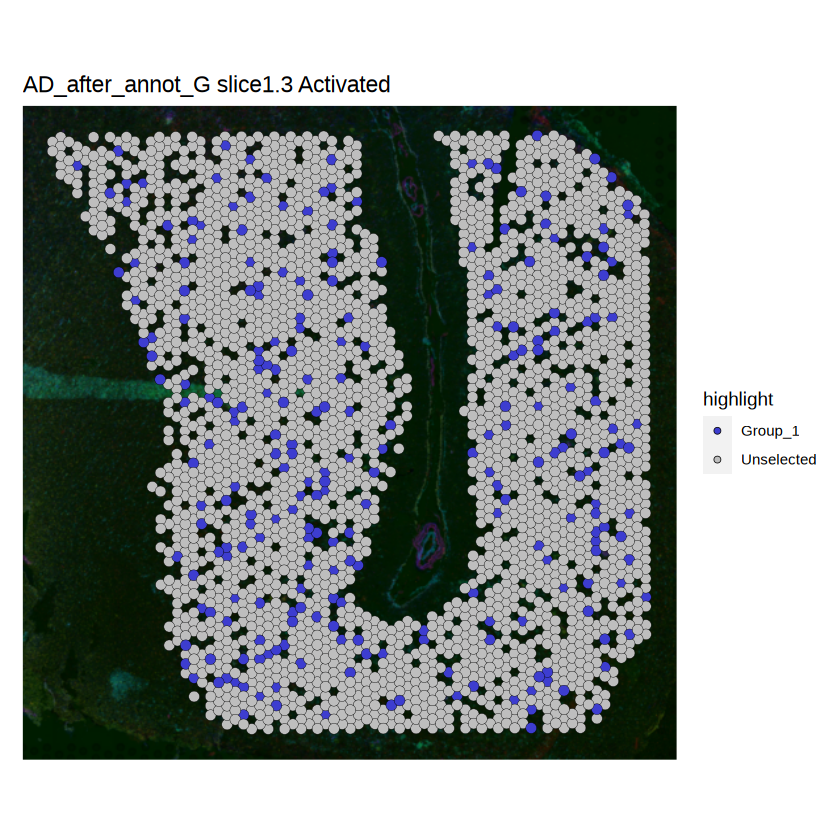

In [4]:
cell_state_list <- c('Homeostatic')

plot1 <- lapply(1:length(cell_state_list), function(ind) {
    nm <- c(cell_state_list)[ind]
    df <- data.frame(Cluster = factor(data1$AB, levels = c("Level 0", "Level 1", "Level 2", "Level 3", "Other")), Sig = data1[, nm], Sample = data1$sample_ID, barcode = data1$barcode, layer = data1$layer_annotation)
    df$Cluster <- droplevels(df$Cluster)

    # Using top 25 % predicted spot not the top 25 spots
    df_75th_percentile <- df %>%
        summarize(Quantile75 = quantile(Sig, 0.75))
    df_filtered1 <- df %>% dplyr::filter(Sig > df_75th_percentile[[1]])
     cell <- df_filtered1$barcode

    for (image in names(file@images)) {
       # print(image)
        p <- SpatialPlot(file, cells.highlight = list(cell), cols.highlight = c("#FF0000", "grey"), label.size = 3, images = image)
        p <- p + ggtitle(paste("AD_after_annot_G", image, nm, sep = " "))
        plot(p)

         p1 <- p + ggtitle("")+NoLegend()
        dir = "/home/a.garg/integration_project/step_14/11march_final/Plots"
        ggsave(paste("ROSMAP_", nm, "_", image, "_layer2-6_.pdf", sep = ""), p1, path = dir)
    }
})

cell_state_list <- c('Activated')

plot2 <- lapply(1:length(cell_state_list), function(ind) {
    nm <- c(cell_state_list)[ind]
    df <- data.frame(Cluster = factor(data1$AB, levels = c("Level 0", "Level 1", "Level 2", "Level 3", "Other")), Sig = data1[, nm], Sample = data1$sample_ID, barcode = data1$barcode, layer = data1$layer_annotation)
    df$Cluster <- droplevels(df$Cluster)

    # Using top 25 % predicted spot not the top 25 spots
    df_75th_percentile <- df %>%
        summarize(Quantile75 = quantile(Sig, 0.75))
    df_filtered1 <- df %>% dplyr::filter(Sig > df_75th_percentile[[1]])
    
     cell <- df_filtered1$barcode

    for (image in names(file@images)) {
       # print(image)
        p <- SpatialPlot(file, cells.highlight = list(cell), cols.highlight = c("#3D3DD0", "grey"), label.size = 3, images = image)
        p <- p + ggtitle(paste("AD_after_annot_G", image, nm, sep = " "))
        plot(p)

         p1 <- p + ggtitle("")+NoLegend()
        dir = "/home/a.garg/integration_project/step_14/11march_final/Plots"
        ggsave(paste("ROSMAP_", nm, "_", image, "_layer2-6_.pdf", sep = ""), p1, path = dir)
    }
})

In all layers

Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”
Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image


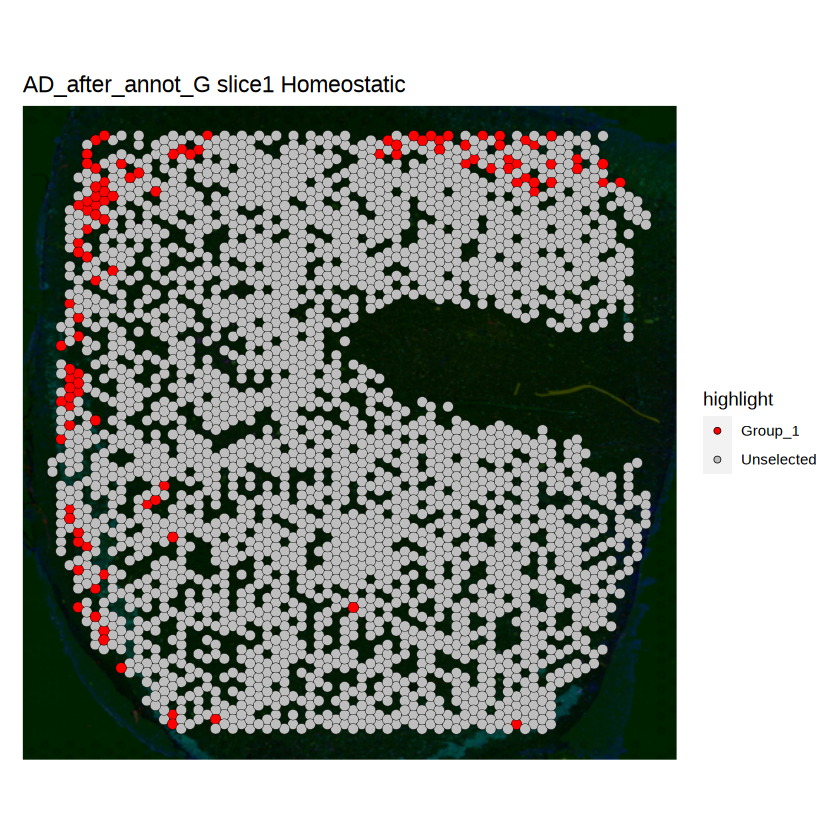

Saving 6.67 x 6.67 in image


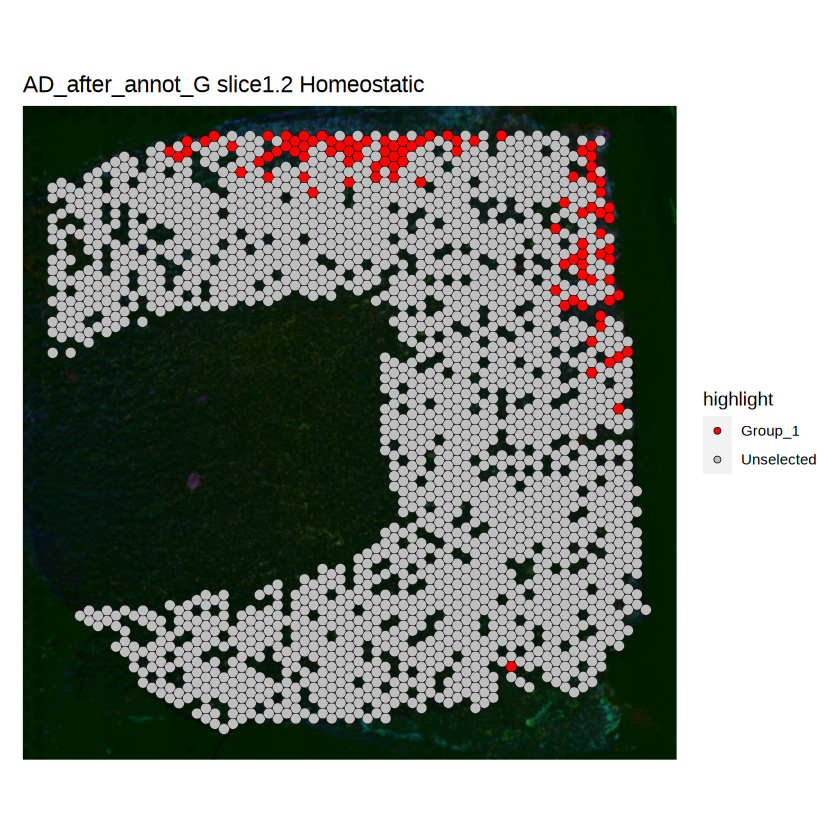

Saving 6.67 x 6.67 in image


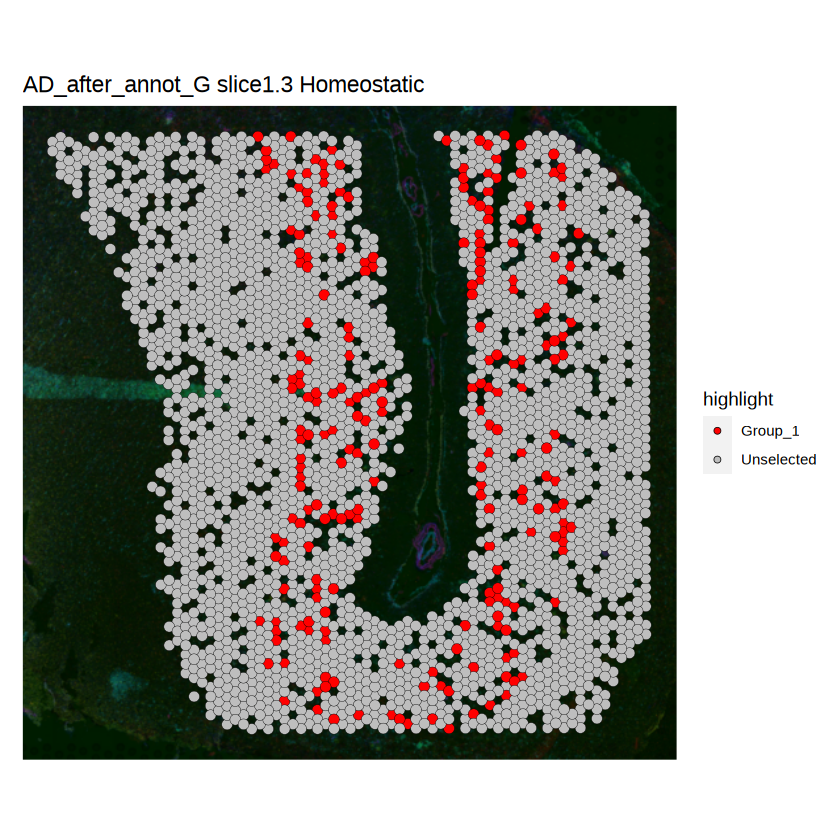

Saving 6.67 x 6.67 in image


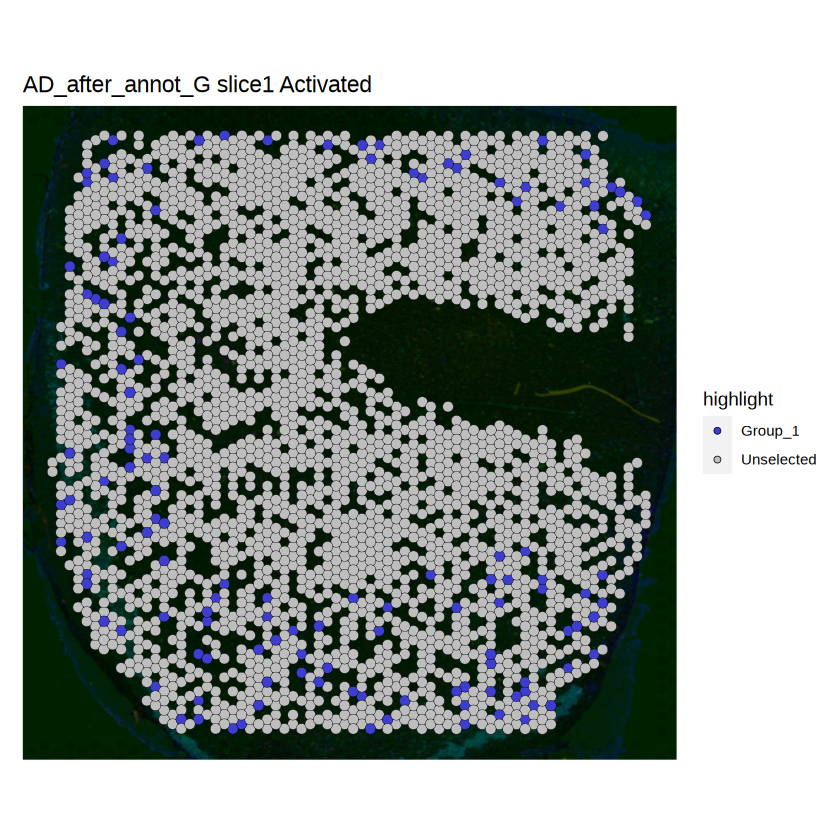

Saving 6.67 x 6.67 in image


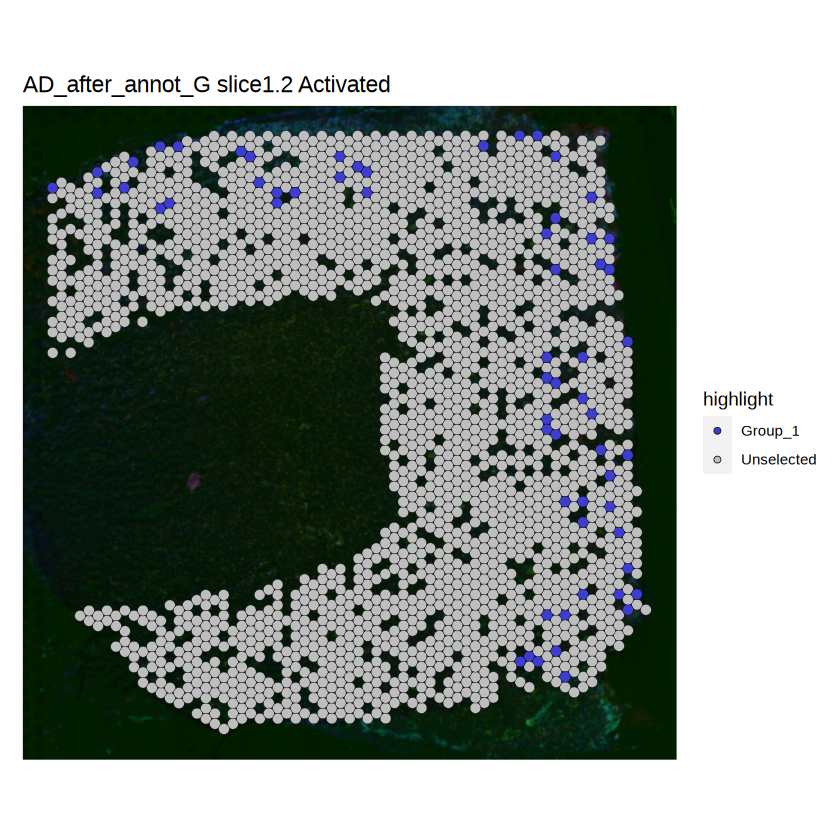

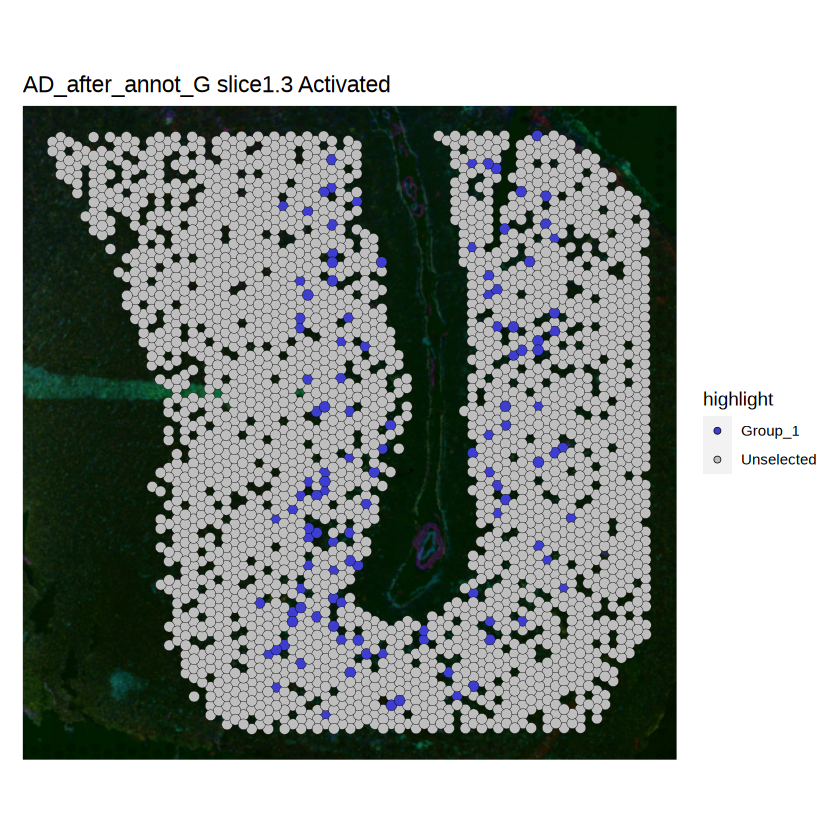

In [3]:


cell_state_list <- c('Homeostatic')

plot1 <- lapply(1:length(cell_state_list), function(ind) {
    nm <- c(cell_state_list)[ind]
    df <- data.frame(Cluster = factor(data1$AB, levels = c("Level 0", "Level 1", "Level 2", "Level 3", "Other")), Sig = data1[, nm], Sample = data1$sample_ID, barcode = data1$barcode, layer = data1$layer_annotation)
    df$Cluster <- droplevels(df$Cluster)

    # Using top 25 % predicted spot not the top 25 spots
    df_75th_percentile <- df %>%
        summarize(Quantile75 = quantile(Sig, 0.75))
    df_filtered1 <- df %>% dplyr::filter(Sig > df_75th_percentile[[1]])

    file_ly2_3 <- subset(df_filtered1, subset = layer %in% c("Layer 2", "Layer 3"))

    cell <- file_ly2_3$barcode
    # cell <- df_filtered1$barcode

    for (image in names(file@images)) {
       # print(image)
        p <- SpatialPlot(file, cells.highlight = list(cell), cols.highlight = c("#FF0000", "grey"), label.size = 3, images = image)
        p <- p + ggtitle(paste("AD_after_annot_G", image, nm, sep = " "))
        plot(p)

         p1 <- p + ggtitle("")+NoLegend()
        dir = "/home/a.garg/integration_project/step_14/11march_final/Plots"
        ggsave(paste("ROSMAP_", nm, "_", image, ".pdf", sep = ""), p1, path = dir)
    }
})

cell_state_list <- c('Activated')

plot2 <- lapply(1:length(cell_state_list), function(ind) {
    nm <- c(cell_state_list)[ind]
    df <- data.frame(Cluster = factor(data1$AB, levels = c("Level 0", "Level 1", "Level 2", "Level 3", "Other")), Sig = data1[, nm], Sample = data1$sample_ID, barcode = data1$barcode, layer = data1$layer_annotation)
    df$Cluster <- droplevels(df$Cluster)

    # Using top 25 % predicted spot not the top 25 spots
    df_75th_percentile <- df %>%
        summarize(Quantile75 = quantile(Sig, 0.75))
    df_filtered1 <- df %>% dplyr::filter(Sig > df_75th_percentile[[1]])

    file_ly2_3 <- subset(df_filtered1, subset = layer %in% c("Layer 2", "Layer 3"))

    cell <- file_ly2_3$barcode
   #  cell <- df_filtered1$barcode

    for (image in names(file@images)) {
       # print(image)
        p <- SpatialPlot(file, cells.highlight = list(cell), cols.highlight = c("#3D3DD0", "grey"), label.size = 3, images = image)
        p <- p + ggtitle(paste("AD_after_annot_G", image, nm, sep = " "))
        plot(p)

         p1 <- p + ggtitle("")+NoLegend()
        dir = "/home/a.garg/integration_project/step_14/11march_final/Plots"
        ggsave(paste("ROSMAP_", nm, "_", image, ".pdf", sep = ""), p1, path = dir)
    }
})

[1] "slice1"
[1] "slice1.2"


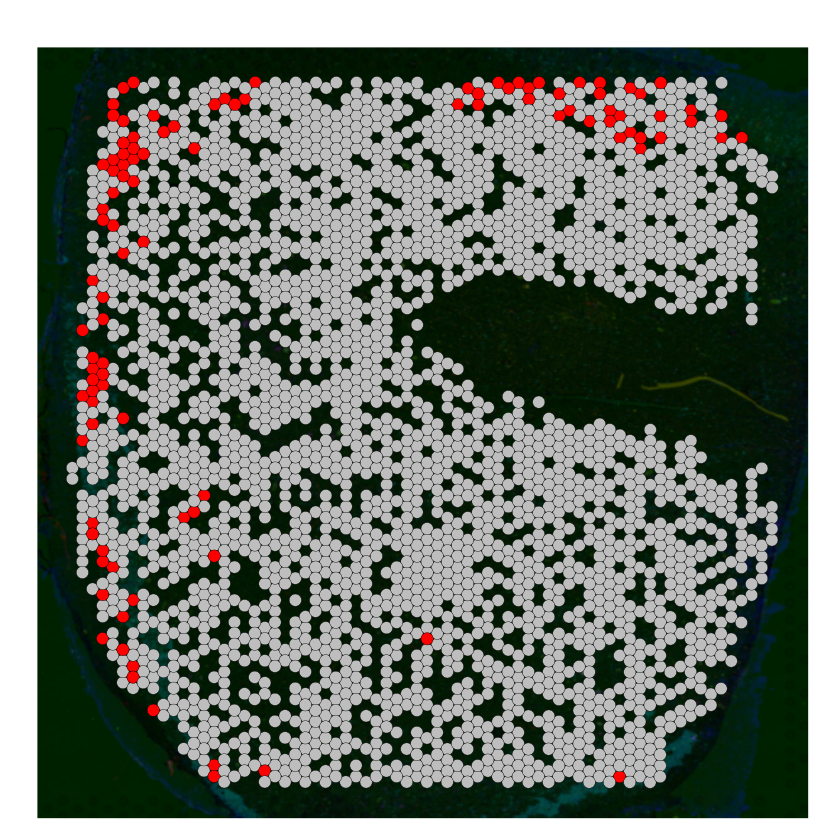

[1] "slice1.3"


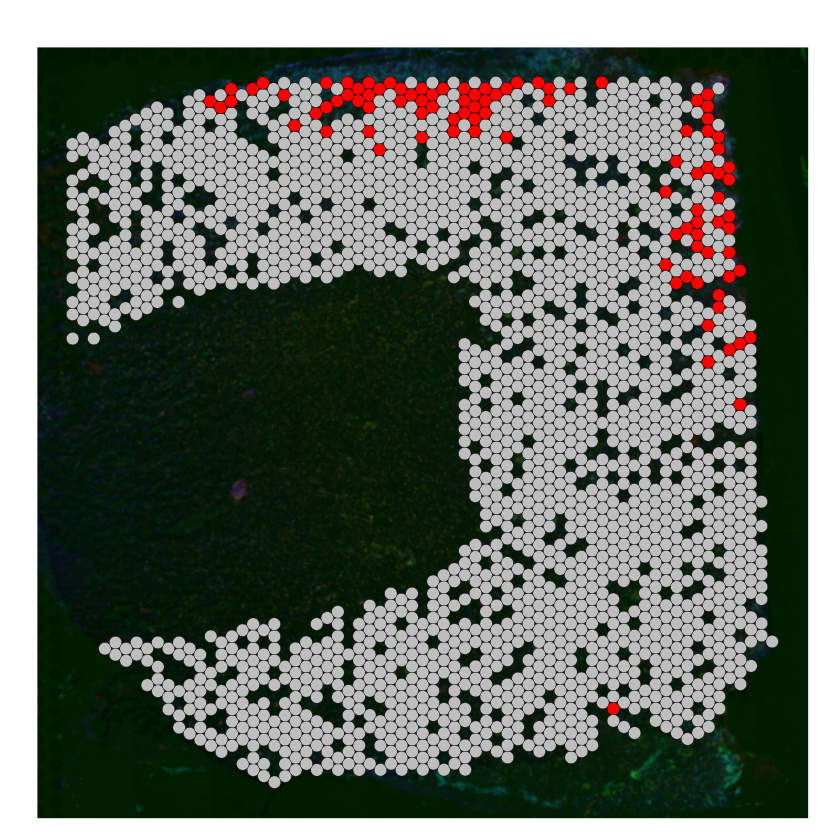

[1] "slice1"


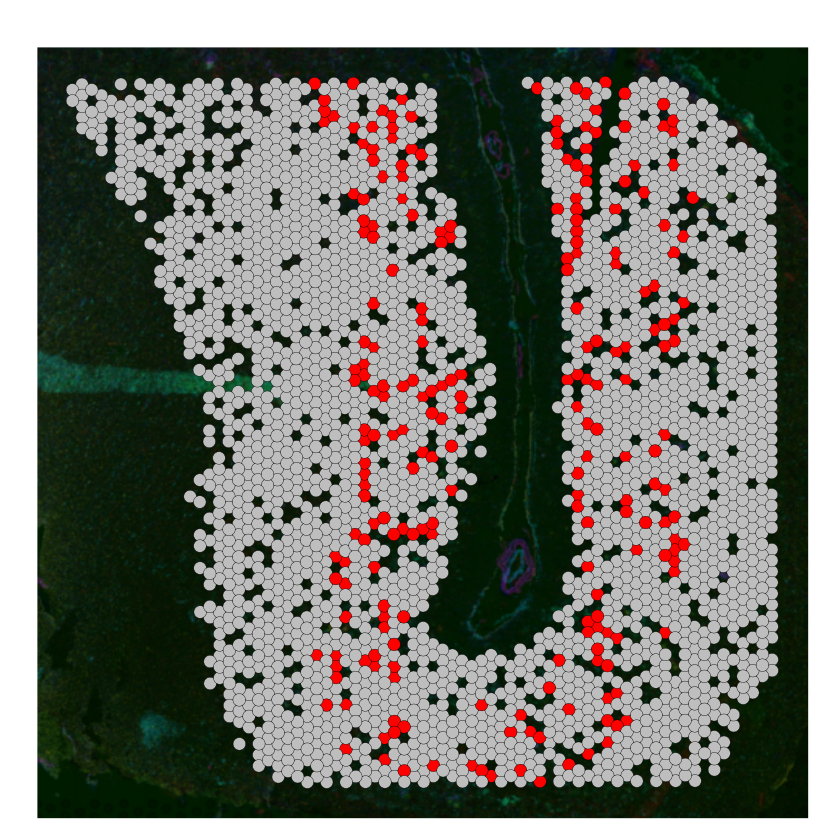

[1] "slice1.2"


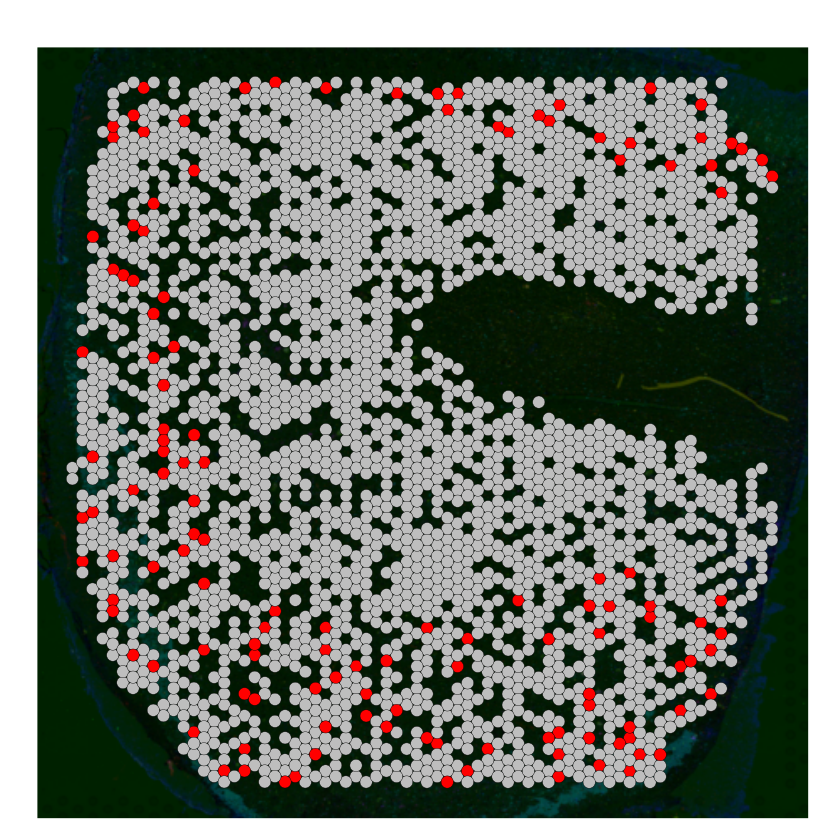

[1] "slice1.3"


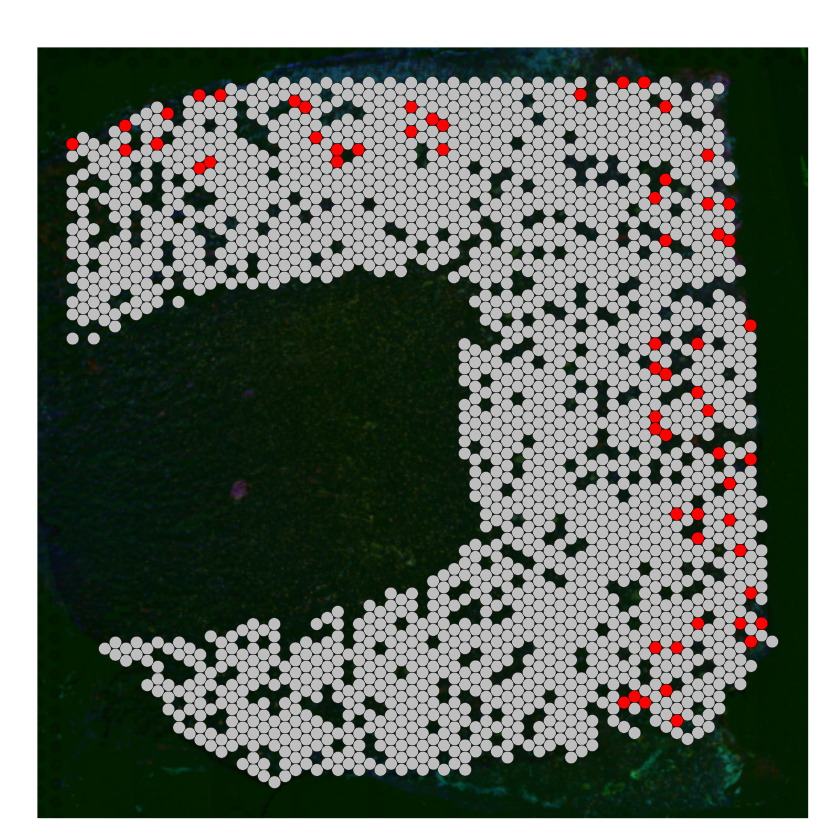

[[1]]
NULL

[[2]]
NULL

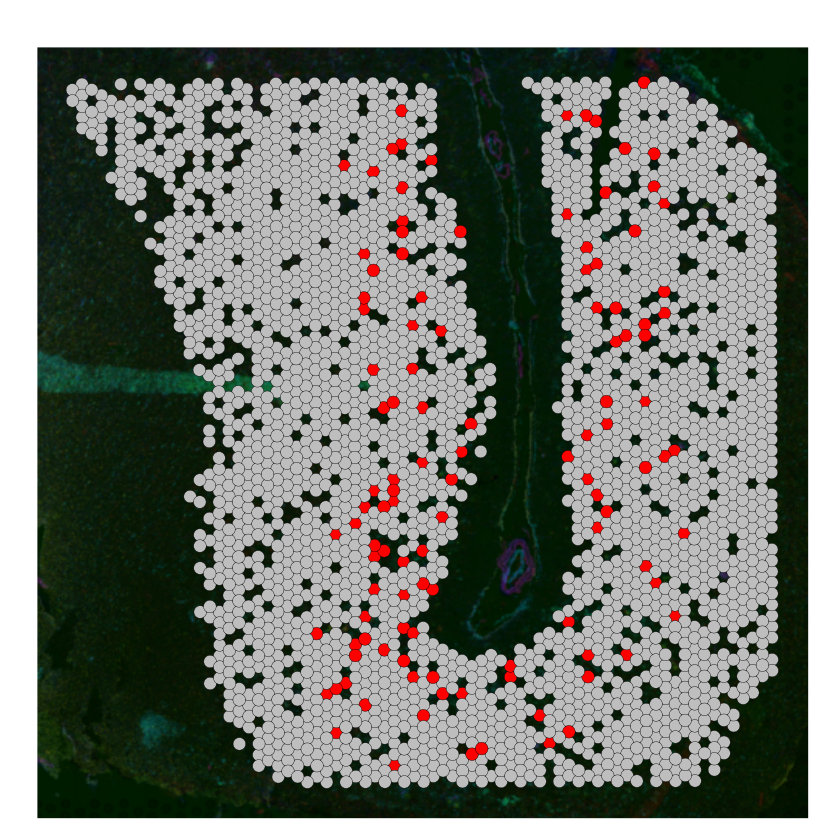

In [7]:
lapply(1:length(cell_state_list), function(ind) {
    nm <- c(cell_state_list)[ind]
    df <- data.frame(Cluster = factor(data1$AB, levels = c("Level 0", "Level 1", "Level 2", "Level 3", "Other")), Sig = data1[, nm], Sample = data1$sample_ID, barcode = data1$barcode, layer = data1$layer_annotation)
    df$Cluster <- droplevels(df$Cluster)

    # Using top 25 % predicted spot not the top 25 spots
    df_75th_percentile <- df %>%
        summarize(Quantile75 = quantile(Sig, 0.75))
    df_filtered1 <- df %>% dplyr::filter(Sig > df_75th_percentile[[1]])

    file_ly2_3 <- subset(df_filtered1, subset = layer %in% c("Layer 2", "Layer 3"))

    cell <- file_ly2_3$barcode
    # cell <- df_filtered1$barcode

    for (image in names(file@images)) {
        print(image)
        p <- SpatialPlot(file, cells.highlight = list(cell), cols.highlight = c("red", "grey"), label.size = 3, images = image)
        p <- p + ggtitle("")+NoLegend()
        plot(p)
     #  dir = "/home/a.garg/integration_project/step_14/11march_final/Plots"
      # ggsave(paste("ROSMAP_", nm, "_", image, ".pdf", sep = ""), p, path = dir)
    }
})

In [14]:
file <- qread("/home/a.garg/integration_project/step_14/AD_afteranno_wd_Hom_activ_ROSMAP.qs")
Idents(file) <- "layer_annotation"
file <- subset(file, idents = "Layer 1", invert = TRUE)
cell_state_list<- c('Homeostatic','Activated')

Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”


In [16]:
    file$barcode <- colnames(file)
    score_data <- as.data.frame(t(file@assays$predictions$data))
    score_data$barcode <- rownames(score_data)

    if (all(rownames(score_data) == colnames(file))) {
        data1 <- merge(x = file@meta.data, y = score_data)
    }
    lapply(1:length(cell_state_list), function(ind) {
    # ind =1
        nm <- c(cell_state_list)[ind]
    df <- data.frame(Cluster = factor(data1$layer_annotation, levels = c("Layer 1", "Layer 2", "Layer 3", "Layer 4", "Layer 5", "Layer 6")), Sig = data1[, nm], Sample = data1$sample_ID, brcode= data1$barcode)
        df$Cluster <- droplevels(df$Cluster)
        
#Using top 25 % predicted spot not the top 25 spots
   df_75th_percentile <- df %>% 
     summarize(Quantile75 = quantile(Sig, 0.75))
#count top 25 % predicted spot not the top 25 spots
    df_filtered1 <- df %>% dplyr::filter(Sig > df_75th_percentile[[1]])
    table(df_filtered1$Cluster) # in all sample
    })
 table(file$layer_annotation)

[[1]]

Layer 2 Layer 3 Layer 4 Layer 5 Layer 6 
    181     250      84     562     409 

[[2]]

Layer 2 Layer 3 Layer 4 Layer 5 Layer 6 
     68     240     127     156     114 



Layer 2 Layer 3 Layer 4 Layer 5 Layer 6 
    779    2611    1058    1868    1235 

In [26]:
s1 <- "AB"
s2 <- "AT8"
s <- s2

In [27]:
   file$barcode <- colnames(file)
    score_data <- as.data.frame(t(file@assays$predictions$data))
    score_data$barcode <- rownames(score_data)

    if (all(rownames(score_data) == colnames(file))) {
        data1 <- merge(x = file@meta.data, y = score_data)
    }
    lapply(1:length(cell_state_list), function(ind) {
        nm <- c(cell_state_list)[ind]
      df <- data.frame(Cluster = factor(data1$layer_annotation, levels = c("Layer 1", "Layer 2", "Layer 3", "Layer 4", "Layer 5", "Layer 6")), Sig = data1[, nm], Sample = data1$sample_ID, Level = data1[,s]) # ATB= data1$AT8
        df$Cluster <- droplevels(df$Cluster)
#Using top 25 % predicted spot not the top 25 spots
   df_75th_percentile <- df %>% 
     summarize(Quantile75 = quantile(Sig, 0.75))
#count top 25 % predicted spot not the top 25 spots
    df_filtered1 <- df %>% dplyr::filter(Sig > df_75th_percentile[[1]])
      print(s)
     table(df_filtered1[,"Level"])
    })
 table(file@meta.data[,s])

[1] "AT8"
[1] "AT8"


[[1]]

Level 0 Level 1 Level 2 Level 3   Other 
    388     526     325     169      78 

[[2]]

Level 0 Level 1 Level 2 Level 3   Other 
    185     281     128      56      55 



Level 0 Level 1 Level 2 Level 3   Other 
   2016    2866    1388     739     542 

In layer 2/3 and layer 4/5/6

In [41]:
s1 <- "AB"
s2 <- "AT8"
s <- s2

In [44]:
layer1 <- c("Layer 2","Layer 3")
layer2 <- c("Layer 4", "Layer 5", "Layer 6")
layer <- layer2

In [45]:
    file$barcode <- colnames(file)
    score_data <- as.data.frame(t(file@assays$predictions$data))
    score_data$barcode <- rownames(score_data)

    if (all(rownames(score_data) == colnames(file))) {
        data1 <- merge(x = file@meta.data, y = score_data)
    }
    lapply(1:length(cell_state_list), function(ind) {
       nm <- c(cell_state_list)[ind]
       df <- data.frame(Cluster = factor(data1$layer_annotation, levels = c("Layer 1", "Layer 2", "Layer 3", "Layer 4", "Layer 5", "Layer 6")), Sig = data1[, nm], Sample = data1$sample_ID, Level = data1[,s]) # ATB= data1$AT8
        df$Cluster <- droplevels(df$Cluster)
        
# #Using top 25 % predicted spot not the top 25 spots
   df_75th_percentile <- df %>%
    summarize(Quantile75 = quantile(Sig, 0.75))
#count top 25 % predicted spot not the top 25 spots
   df_filtered1 <- df %>% dplyr::filter(Sig > df_75th_percentile[[1]])


 file_ly <- subset(df_filtered1, subset = Cluster %in% layer)
 table(file_ly[,"Level"])

    })

########## TOTAL ######################### 

file_ly <- subset(file, subset = layer_annotation %in% layer)
 table(file_ly@meta.data[,s])

[[1]]

Level 0 Level 1 Level 2 Level 3   Other 
    260     398     238     118      41 

[[2]]

Level 0 Level 1 Level 2 Level 3   Other 
    105     147      78      37      30 


Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”



Level 0 Level 1 Level 2 Level 3   Other 
   1117    1546     797     439     262 

In [50]:
s1 <- "AB"
s2 <- "AT8"
s <- s1

In samples

In [51]:
    file$barcode <- colnames(file)
    score_data <- as.data.frame(t(file@assays$predictions$data))
    score_data$barcode <- rownames(score_data)

    if (all(rownames(score_data) == colnames(file))) {
        data1 <- merge(x = file@meta.data, y = score_data)
    }

  
    lapply(1:length(cell_state_list), function(ind) {
       nm <- c(cell_state_list)[ind]
       df <- data.frame(Cluster = factor(data1$layer_annotation, levels = c("Layer 1", "Layer 2", "Layer 3", "Layer 4", "Layer 5", "Layer 6")), Sig = data1[, nm], Sample = data1$sample_ID, Level = data1[,s]) 
        df$Cluster <- droplevels(df$Cluster)
        
# #Using top 25 % predicted spot not the top 25 spots
   df_75th_percentile <- df %>%
    summarize(Quantile75 = quantile(Sig, 0.75))
#count top 25 % predicted spot not the top 25 spots
   df_filtered1 <- df %>% dplyr::filter(Sig > df_75th_percentile[[1]])
 file_ly2_3 <- subset(df_filtered1, subset = Cluster %in% c("Layer 2","Layer 3"))

# in each sample
layer_val <- lapply(c("AD-1","AD-2","AD-3"), function(i) {
print(i)
df_check <- subset(file_ly2_3, subset = Sample == i)
table(df_check[,"Level"])
})
})

#########################
file_ly2_3 <- subset(file, subset = layer_annotation %in% c("Layer 2","Layer 3"))
#table(file_ly@meta.data[,s])
 
layer_val <- lapply(c("AD-1","AD-2","AD-3"), function(i) {
print(i)
df_check <- subset(file_ly2_3, subset = sample_ID == i)
table(df_check@meta.data[,s])   
})
layer_val

[1] "AD-1"
[1] "AD-2"
[1] "AD-3"
[1] "AD-1"
[1] "AD-2"
[1] "AD-3"


[[1]]
[[1]][[1]]

Level 0 Level 1 Level 2 Level 3   Other 
     20      53      21       8       2 

[[1]][[2]]

Level 0 Level 1 Level 2 Level 3   Other 
     33      40      14       7       3 

[[1]][[3]]

Level 0 Level 1 Level 2 Level 3   Other 
     20      87      69      39      15 


[[2]]
[[2]][[1]]

Level 0 Level 1 Level 2 Level 3   Other 
     29      72      26       3       2 

[[2]][[2]]

Level 0 Level 1 Level 2 Level 3   Other 
     22      30       8       1       1 

[[2]][[3]]

Level 0 Level 1 Level 2 Level 3   Other 
     16      40      36      17       5 



Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”


[1] "AD-1"


Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”


[1] "AD-2"


Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”


[1] "AD-3"


Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”


[[1]]

Level 0 Level 1 Level 2 Level 3   Other 
    329     676     212      41      13 

[[2]]

Level 0 Level 1 Level 2 Level 3   Other 
    250     323      83      23       6 

[[3]]

Level 0 Level 1 Level 2 Level 3   Other 
    192     574     398     207      63 


Chisq-val

In [2]:
#homeostatic

data <- c(431,2959,1055,3106)
matrices <- matrix(data, nrow = 2, byrow = TRUE)
matrices
score <- chisq.test(matrices)
score

431,2959
1055,3106



	Pearson's Chi-squared test with Yates' continuity correction

data:  matrices
X-squared = 188.04, df = 1, p-value < 2.2e-16


In [3]:
#activated

data <- c(308,3082,397,3764)
matrices <- matrix(data, nrow = 2, byrow = TRUE)
matrices
score <- chisq.test(matrices)
score

308,3082
397,3764



	Pearson's Chi-squared test with Yates' continuity correction

data:  matrices
X-squared = 0.40552, df = 1, p-value = 0.5243


In [9]:
exl_file <- read_excel("/home/a.garg/integration_project/step_14/with_int_KD/check.xlsx", sheet = "Sheet12")
df1<- exl_file[1:2,1:6] 
df2<- exl_file[4,1:6] 
df3<- exl_file[6:7,1:6]
df4<- exl_file[9,1:6]

df1
df2
df3
df4

Cell_state,Level 0,Level 1,Level 2,Level 3,Other
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
Homeostatic,214,622,374,170,106
Activated,125,295,164,77,44


Cell_state,Level 0,Level 1,Level 2,Level 3,Other
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
Total number,1370,3250,1698,724,509


Cell_state,Level 0,Level 1,Level 2,Level 3,Other
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
Homeostatic,1272,650,276,106,NA
Activated,580,285,121,44,NA


Cell_state,Level 0,Level 1,Level 2,Level 3,Other
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
Total number,6181,2931,1233,509,NA


In [10]:
# pred1
df1 <- gather(df1, "Level", "pred_num1", -c(Cell_state))

df1 <- df1 %>%
  mutate(pred_num1 = as.numeric(pred_num1))

# pred2

df3 <- gather(df3, "Level", "pred_num2", -c(Cell_state))

df3 <- df3 %>%
  mutate(pred_num2 = as.numeric(pred_num2))

df3_merge <- merge(x=df1,y=df3, 
          by=c("Cell_state","Level"), all.x=TRUE, sort = FALSE)

# pred3
df2 <- gather(df2, "Level", "pred_num3", -c(Cell_state))
df2 <- df2 %>%
  mutate(pred_num3 = as.numeric(pred_num3))

# pred4
df4 <- gather(df4, "Level", "pred_num4", -c(Cell_state))
df4 <- df4 %>%
  mutate(pred_num4 = as.numeric(pred_num4))

df4_merge <- merge(x=df2,y=df4, 
          by=c("Level","Cell_state"), all.x=TRUE)

df_merged <- merge(x=df3_merge,y=df4_merge, 
          by=c("Level"), all.x=TRUE)

check<- df_merged %>% mutate(pred_num3 = pred_num3 - pred_num1) %>% mutate(pred_num4 = pred_num4 - pred_num2) %>% select(-Cell_state.y)

chisq_score <- lapply(seq(dim(check)[1]-2), function(x){
data <- check[,c(3:6)]
# Convert each row into a matrix
#x=1
matrices <- matrix(as.numeric(data[x, ]), nrow = 2, byrow = TRUE)
# Print the matrices
print(matrices)
score <- chisq.test(matrices)
return(sprintf('%s, %s, %s', check$Level[x], check$Cell_state.x[x], (format(score$p.value, digits=3,scientific=TRUE))))

}) 

as.data.frame(unlist(chisq_score))

     [,1] [,2]
[1,]  214 1272
[2,] 1156 4909
     [,1] [,2]
[1,]  125  580
[2,] 1245 5601
     [,1] [,2]
[1,]  622  650
[2,] 2628 2281
     [,1] [,2]
[1,]  295  285
[2,] 2955 2646
     [,1] [,2]
[1,]  374  276
[2,] 1324  957
     [,1] [,2]
[1,]  164  121
[2,] 1534 1112
     [,1] [,2]
[1,]  170  106
[2,]  554  403
     [,1] [,2]
[1,]   77   44
[2,]  647  465


unlist(chisq_score)
<chr>
"Level 0, Homeostatic, 3.49e-05"
"Level 0, Activated, 8.05e-01"
"Level 1, Homeostatic, 3.51e-03"
"Level 1, Activated, 4.08e-01"
"Level 2, Homeostatic, 8.53e-01"
"Level 2, Activated, 9.39e-01"
"Level 3, Homeostatic, 3.02e-01"
"Level 3, Activated, 2.89e-01"


compartive barplot 

All

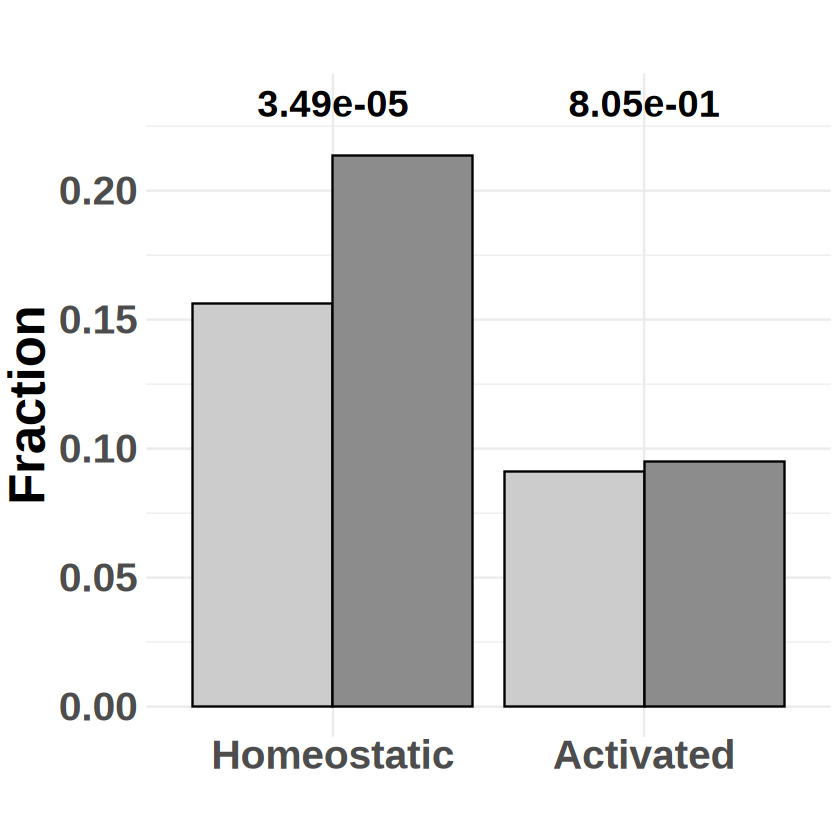

In [4]:
# read the data
exl_file <- read_excel("/home/a.garg/integration_project/step_14/11march_final/ROSMAP_plot_data.xlsx", sheet = "Sheet1", .name_repair = "minimal")

data <- exl_file[, c(1:3, 6)]
data$Cell_state <- factor(data$Cell_state, levels = c("Homeostatic", "Activated"))
data$p.sci <- format(data$`Ab-pval`, digits = 3, scientific = TRUE)
data_long <- gather(data, key = "Ab_Type", value = "Ab_Value", `Ab-Level 0`, `Ab-Others`)



p <- ggplot(data_long, aes(x = Cell_state, y = Ab_Value, fill = Ab_Type)) +
    geom_bar(position = "dodge", stat = "identity", colour = "black") +
    ggtitle("") +
    theme_minimal() +
    scale_fill_manual(values = c("#cccccc", "#8c8c8c")) +
    annotate("text",
        x = c(1, 2), y = max(data_long$Ab_Value) + 0.02,
        label = data$p.sci, size = 8, fontface = "bold"
    ) +
    theme(
        text = element_text(size = 30, face = "bold"),
        axis.text.x = element_text(angle = 0, vjust = 1.5)
    )+ NoLegend()+xlab("")+ylab("Fraction")
ggsave("/home/a.garg/integration_project/step_14/11march_final/Plots/ROSMAP_AB_all_layer.pdf",  width = 6,height = 5,bg ="white")
p

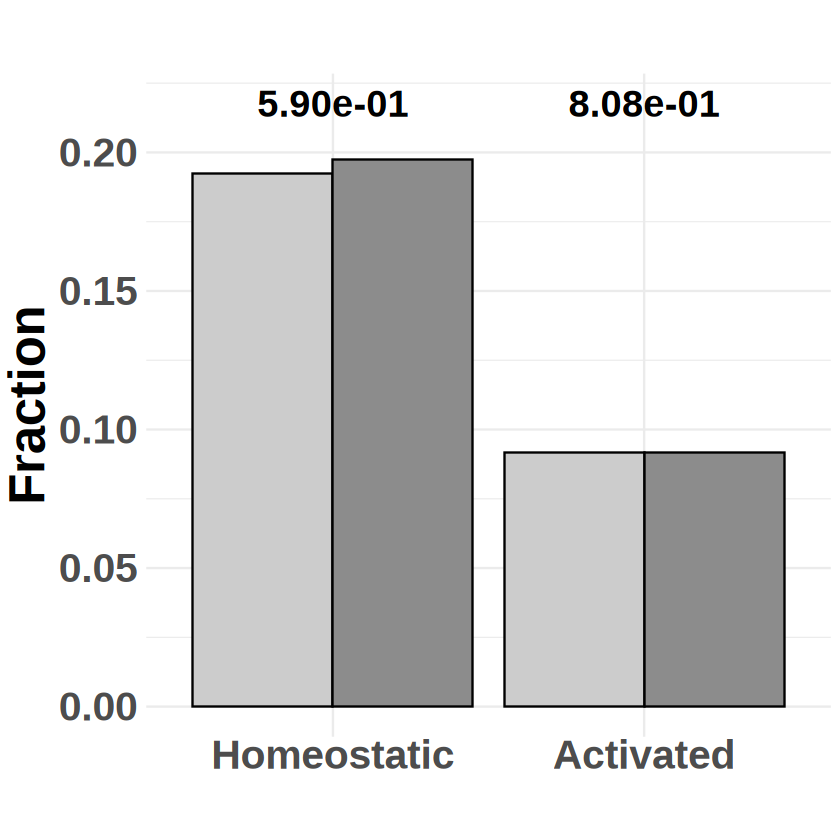

In [5]:
# read the data
exl_file <- read_excel("/home/a.garg/integration_project/step_14/11march_final/ROSMAP_plot_data.xlsx", sheet = "Sheet1", .name_repair = "minimal")

data <- exl_file[, c(1, 4:5, 7)]
data$Cell_state <- factor(data$Cell_state, levels = c("Homeostatic", "Activated"))
data_long <- gather(data, key = "AT8_Type", value = "AT8_Value", `AT8-Level 0`, `AT8-Others`)
data$p.sci <- format(data$`AT8-pval`, scientific = TRUE)


p <- ggplot(data_long, aes(x = Cell_state, y = AT8_Value, fill = AT8_Type)) +
    geom_bar(position = "dodge", stat = "identity", colour = "black") +
    ggtitle("") +
    theme_minimal() +
    scale_fill_manual(values = c("#cccccc", "#8c8c8c")) +
    annotate("text",
        x = c(1, 2), y = max(data_long$AT8_Value) + 0.02,
        label = data$p.sci, size = 8, fontface = "bold"
    ) +
    theme(
        text = element_text(size = 30, face = "bold"),
        axis.text.x = element_text(angle = 0,  vjust = 1.5)
    )+ NoLegend()+xlab("")+ylab("Fraction")
ggsave("/home/a.garg/integration_project/step_14/11march_final/Plots/ROSMAP_AT8_all_layer.pdf",  width = 6,height = 5,bg ="white")
p

layer 2-3

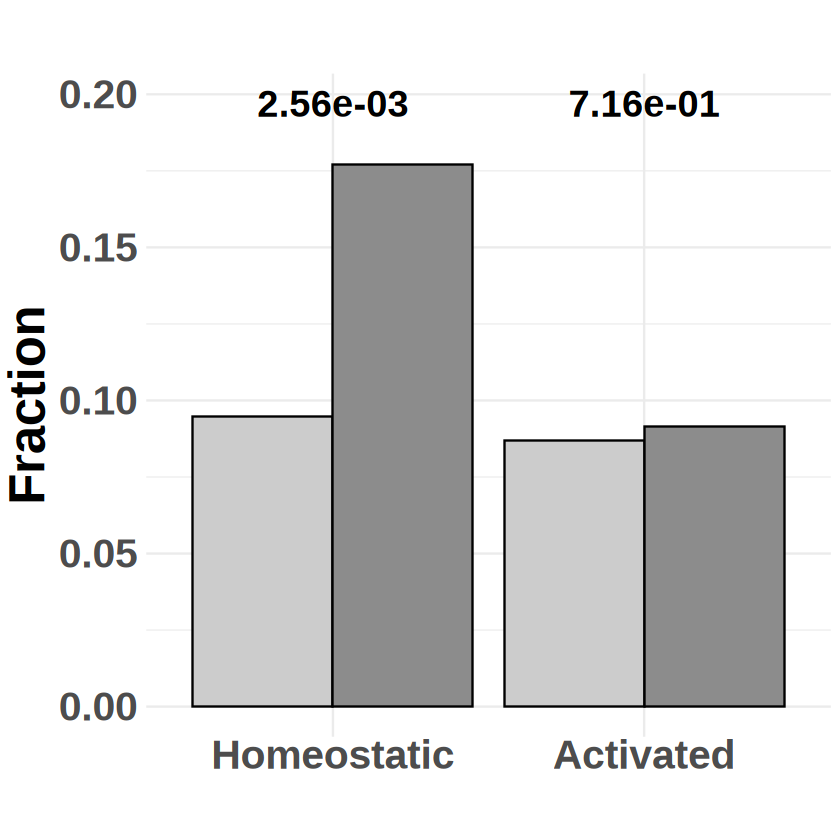

In [6]:
# read the data
exl_file <- read_excel("/home/a.garg/integration_project/step_14/11march_final/ROSMAP_plot_data.xlsx", sheet = "Sheet2", .name_repair = "minimal")

data <- exl_file[, c(1:3, 6)]
data$Cell_state <- factor(data$Cell_state, levels = c("Homeostatic", "Activated"))
data$p.sci <- format(data$`Ab-pval`, digits = 3, scientific = TRUE)
data_long <- gather(data, key = "Ab_Type", value = "Ab_Value", `Ab-Level 0`, `Ab-Others`)



p <- ggplot(data_long, aes(x = Cell_state, y = Ab_Value, fill = Ab_Type)) +
    geom_bar(position = "dodge", stat = "identity", colour = "black") +
    ggtitle("") +
    theme_minimal() +
    scale_fill_manual(values = c("#cccccc", "#8c8c8c")) +
    annotate("text",
        x = c(1, 2), y = max(data_long$Ab_Value) + 0.02,
        label = data$p.sci, size = 8, fontface = "bold"
    ) +
    theme(
        text = element_text(size = 30, face = "bold"),
        axis.text.x = element_text(angle = 0, vjust = 1.5)
    )+ NoLegend()+xlab("")+ylab("Fraction")
ggsave("/home/a.garg/integration_project/step_14/11march_final/Plots/ROSMAP_AB_2-3layer.pdf", width = 6,height = 5,bg ="white")
p

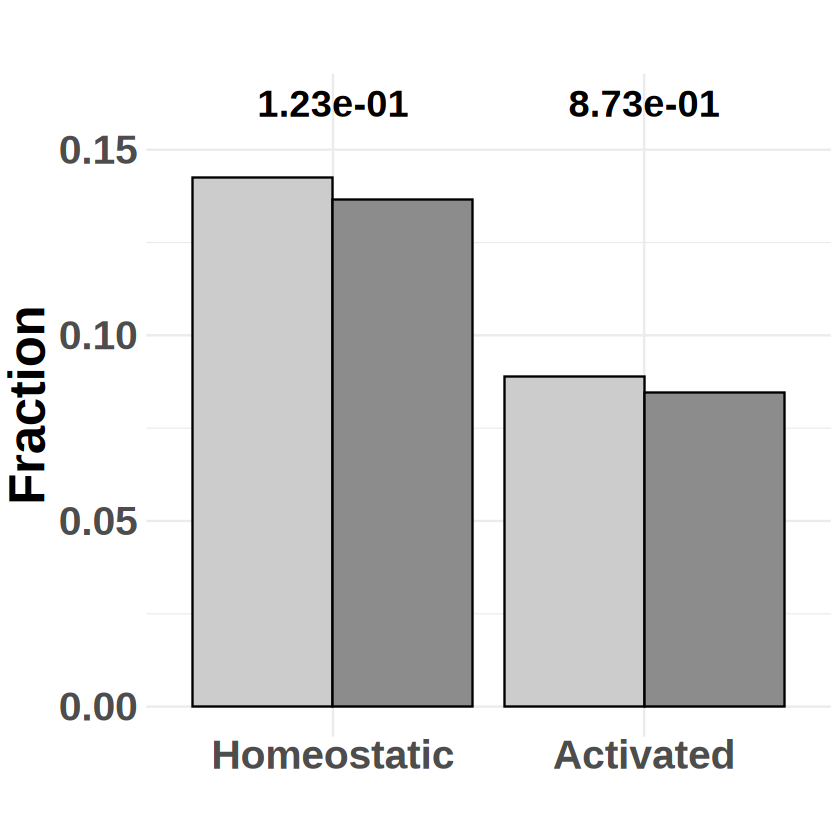

In [7]:
# read the data
exl_file <- read_excel("/home/a.garg/integration_project/step_14/11march_final/ROSMAP_plot_data.xlsx", sheet = "Sheet2", .name_repair = "minimal")

data <- exl_file[, c(1, 4:5, 7)]
data$Cell_state <- factor(data$Cell_state, levels = c("Homeostatic", "Activated"))
data_long <- gather(data, key = "AT8_Type", value = "AT8_Value", `AT8-Level 0`, `AT8-Others`)
data$p.sci <- format(data$`AT8-pval`, scientific = TRUE)


p <- ggplot(data_long, aes(x = Cell_state, y = AT8_Value, fill = AT8_Type)) +
    geom_bar(position = "dodge", stat = "identity", colour = "black") +
    ggtitle("") +
    theme_minimal() +
    scale_fill_manual(values = c("#cccccc", "#8c8c8c")) +
    annotate("text",
        x = c(1, 2), y = max(data_long$AT8_Value) + 0.02,
        label = data$p.sci, size = 8, fontface = "bold"
    ) +
    theme(
        text = element_text(size = 30, face = "bold"),
        axis.text.x = element_text(angle = 0,  vjust = 1.5)
    )+ NoLegend()+xlab("")+ylab("Fraction")
ggsave("/home/a.garg/integration_project/step_14/11march_final/Plots/ROSMAP_AT8_2-3layer.pdf",  width = 6,height = 5,bg ="white")
p

layer 4/5/6

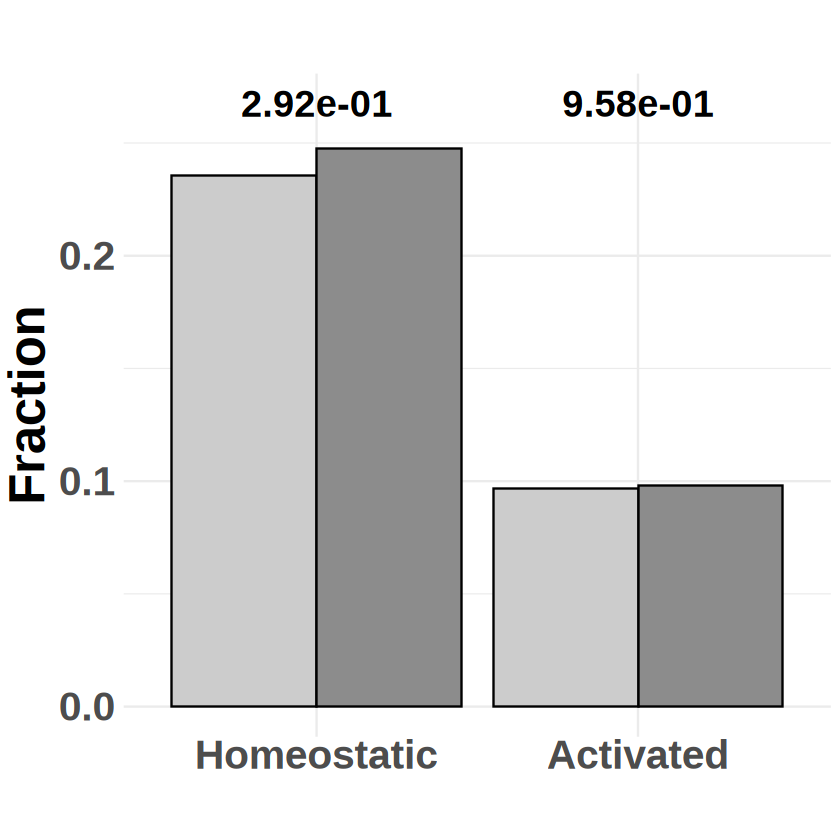

In [8]:
# read the data
exl_file <- read_excel("/home/a.garg/integration_project/step_14/11march_final/ROSMAP_plot_data.xlsx", sheet = "Sheet3", .name_repair = "minimal")

data <- exl_file[, c(1:3, 6)]
data$Cell_state <- factor(data$Cell_state, levels = c("Homeostatic", "Activated"))
data$p.sci <- format(data$`Ab-pval`, digits = 3, scientific = TRUE)
data_long <- gather(data, key = "Ab_Type", value = "Ab_Value", `Ab-Level 0`, `Ab-Others`)



p <- ggplot(data_long, aes(x = Cell_state, y = Ab_Value, fill = Ab_Type)) +
    geom_bar(position = "dodge", stat = "identity", colour = "black") +
    ggtitle("") +
    theme_minimal() +
    scale_fill_manual(values = c("#cccccc", "#8c8c8c")) +
    annotate("text",
        x = c(1, 2), y = max(data_long$Ab_Value) + 0.02,
        label = data$p.sci, size = 8, fontface = "bold"
    ) +
    theme(
        text = element_text(size = 30, face = "bold"),
        axis.text.x = element_text(angle = 0, vjust = 1.5)
    )+ NoLegend()+xlab("")+ylab("Fraction")
ggsave("/home/a.garg/integration_project/step_14/11march_final/Plots/ROSMAP_AB_4-6layer.pdf",  width = 6,height = 5,bg ="white")
p

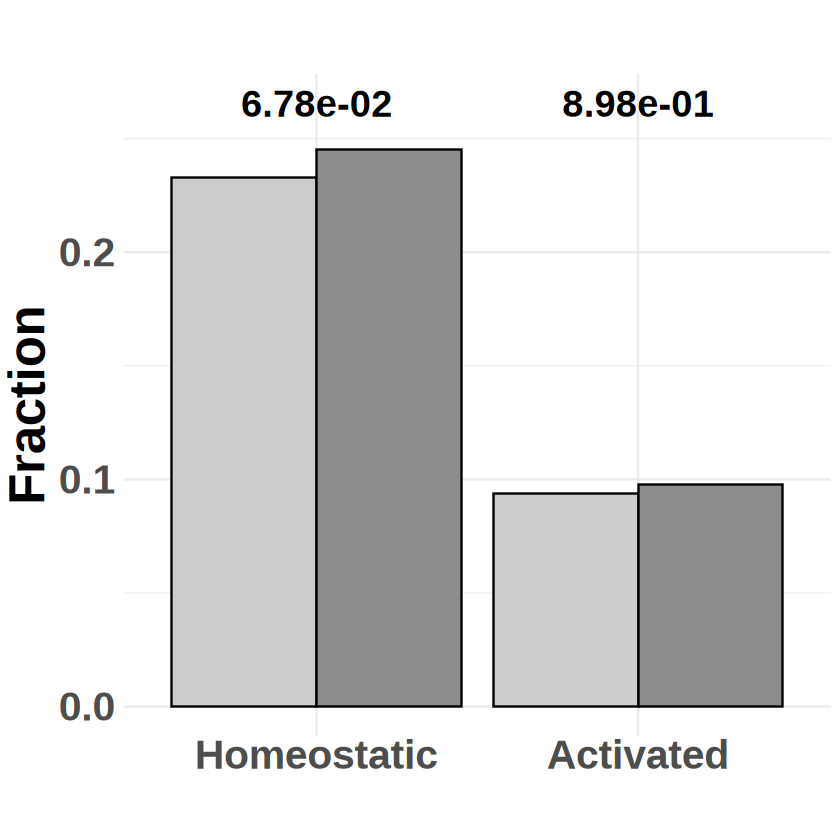

In [9]:
# read the data
exl_file <- read_excel("/home/a.garg/integration_project/step_14/11march_final/ROSMAP_plot_data.xlsx", sheet = "Sheet3", .name_repair = "minimal")

data <- exl_file[, c(1, 4:5, 7)]
data$Cell_state <- factor(data$Cell_state, levels = c("Homeostatic", "Activated"))
data_long <- gather(data, key = "AT8_Type", value = "AT8_Value", `AT8-Level 0`, `AT8-Others`)
data$p.sci <- format(data$`AT8-pval`, scientific = TRUE)


p <- ggplot(data_long, aes(x = Cell_state, y = AT8_Value, fill = AT8_Type)) +
    geom_bar(position = "dodge", stat = "identity", colour = "black") +
    ggtitle("") +
    theme_minimal() +
    scale_fill_manual(values = c("#cccccc", "#8c8c8c")) +
    annotate("text",
        x = c(1, 2), y = max(data_long$AT8_Value) + 0.02,
        label = data$p.sci, size = 8, fontface = "bold"
    ) +
    theme(
        text = element_text(size = 30, face = "bold"),
        axis.text.x = element_text(angle = 0,  vjust = 1.5)
    )+ NoLegend()+xlab("")+ylab("Fraction")
ggsave("/home/a.garg/integration_project/step_14/11march_final/Plots/ROSMAP_AT8_4-6layer.pdf",  width = 6,height = 5,bg ="white")
p

AD samples

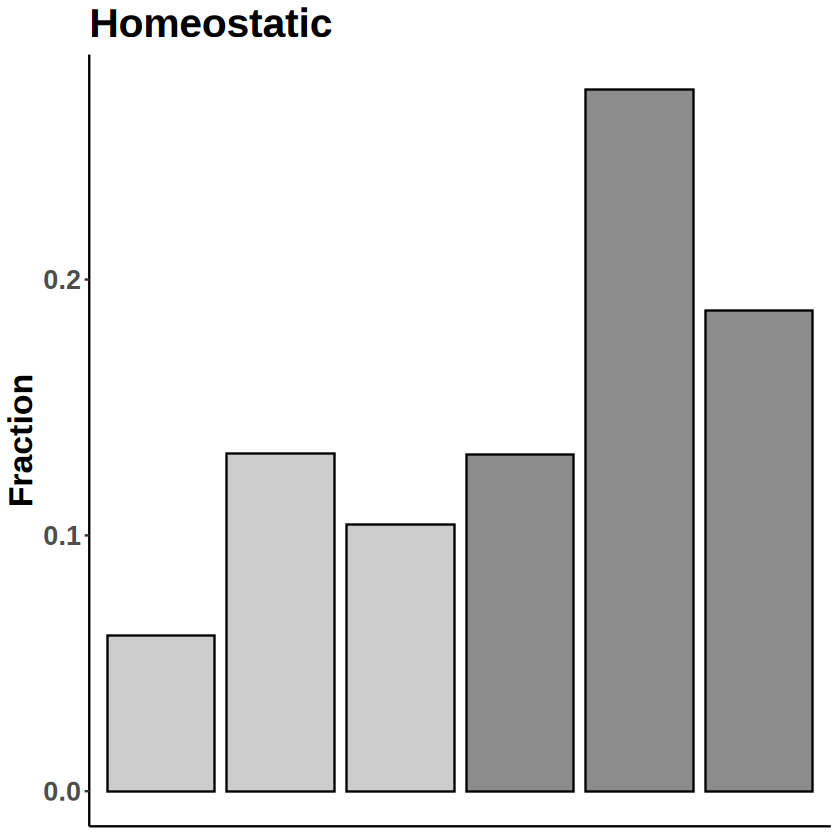

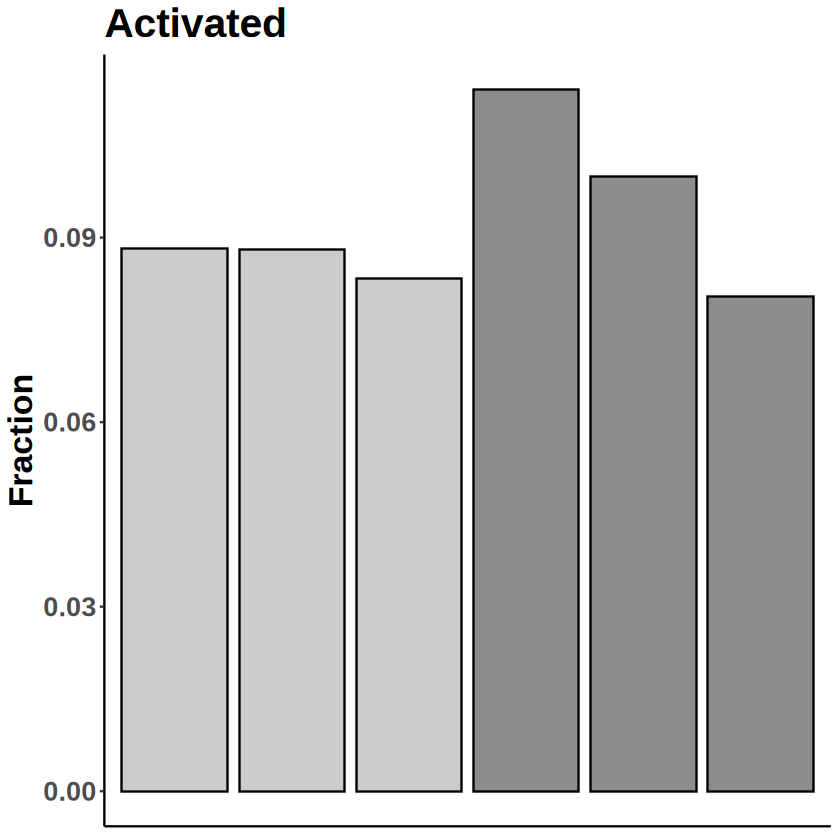

In [2]:
# read the data
exl_file <- read_excel("/home/a.garg/integration_project/step_14/11march_final/ROSMAP_plot_data.xlsx", sheet = "Sheet4", .name_repair = "minimal")
data <- exl_file[, c(1:3, 6)]
data$Cell_state <- factor(data$Cell_state, levels = c("Homeostatic", "Activated"))
sample <- rep(c(rep("AD-1", 2), rep("AD-2", 2), rep("AD-3", 2)))
data$sample <- sample
data_long <- gather(data, key = "Ab_Type", value = "Ab_Value", `Ab-Level 0`, `Ab-Others`)


# Initialize an empty list to store plots
plots <- list()

# Get unique levels of Cell_state
unique_cell_states <- unique(data$Cell_state)

# Iterate through unique levels of Cell_state
plots <- lapply(seq_along(unique_cell_states), function(x) {
  df <- data_long %>% filter(str_detect(Cell_state, levels(data$Cell_state)[x]))
  df_p_val <- data.frame(
    Ab_Type = c("Ab-Others", "Ab-Others", "Ab-Others"),
    group1 = c("AD-1", "AD-2", "AD-3"),
    group2 = c("AD-1", "AD-2", "AD-3"),
    p.val = signif(as.numeric(df$`Ab-pval`)[1:3], digits = 3)
    
  )
df_p_val$p.sci <- format(df_p_val$p.val, scientific = TRUE)


# Create a new variable combining Ab_Type and sample
df$sample_Ab <- factor(paste(df$Ab_Type, df$sample), levels = unique(paste(df$Ab_Type, df$sample)))

# Iterate through unique levels of Cell_state
p <- ggplot(df, aes(x = sample_Ab, y = Ab_Value, fill = Ab_Type)) +
  geom_bar(position = "dodge", stat = "identity", colour = 'black') +
  ggtitle(unique_cell_states[x]) +
 # theme_minimal() +
 theme_classic()+NoLegend()+
  scale_fill_manual(values = c("#cccccc", "#8c8c8c")) +
  theme(text = element_text(size = 20, face = "bold"),
        axis.text.x = element_text(angle = 45, hjust = 1)) +
  #stat_pvalue_manual(df_p_val, label = 'p.sci', y.position = max(df$Ab_Value) + 0.01, size = 6, face = "bold") +
  #NoLegend() +
  xlab("Samples") +
  ylab("Fraction")+
   theme(axis.title.x=element_blank(),
        axis.text.x=element_blank(),
        axis.ticks.x=element_blank())
plot(p)

  plots[[x]] <- p  # Store the plot in the list
})

ggsave(plot = plots[[1]],"/home/a.garg/integration_project/step_14/11march_final/Plots/comp_ROSMAP_AB_2-3layer_samples_hom.pdf", width = 4,height =4,bg ="white")
ggsave(plot = plots[[2]],"/home/a.garg/integration_project/step_14/11march_final/Plots/com_ROSMAP_AB_2-3layer_samples_act.pdf", width = 4,height =4,bg ="white")


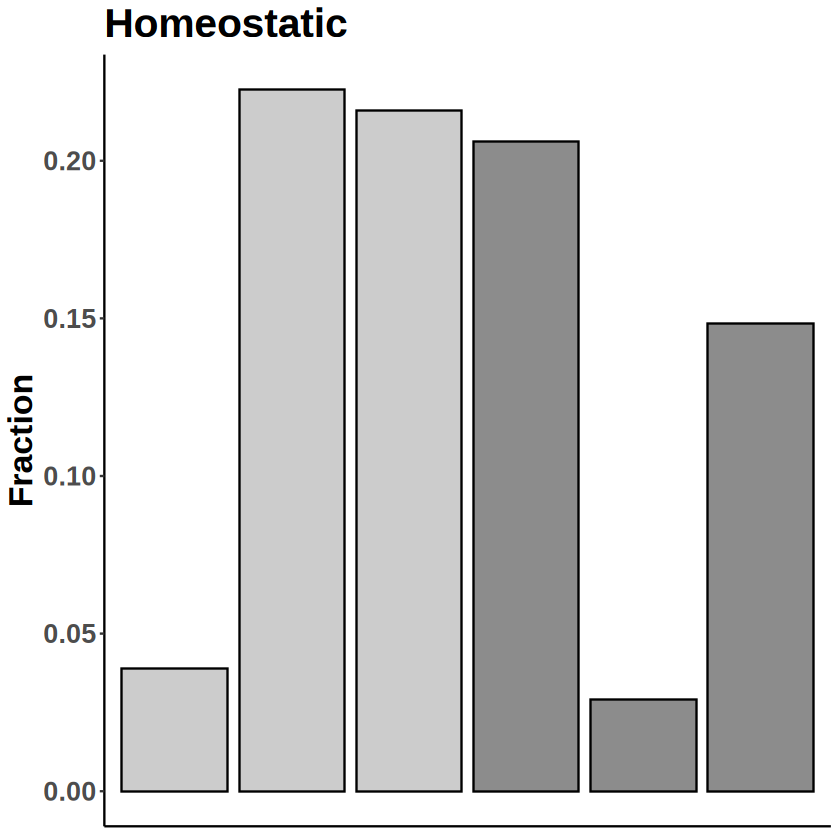

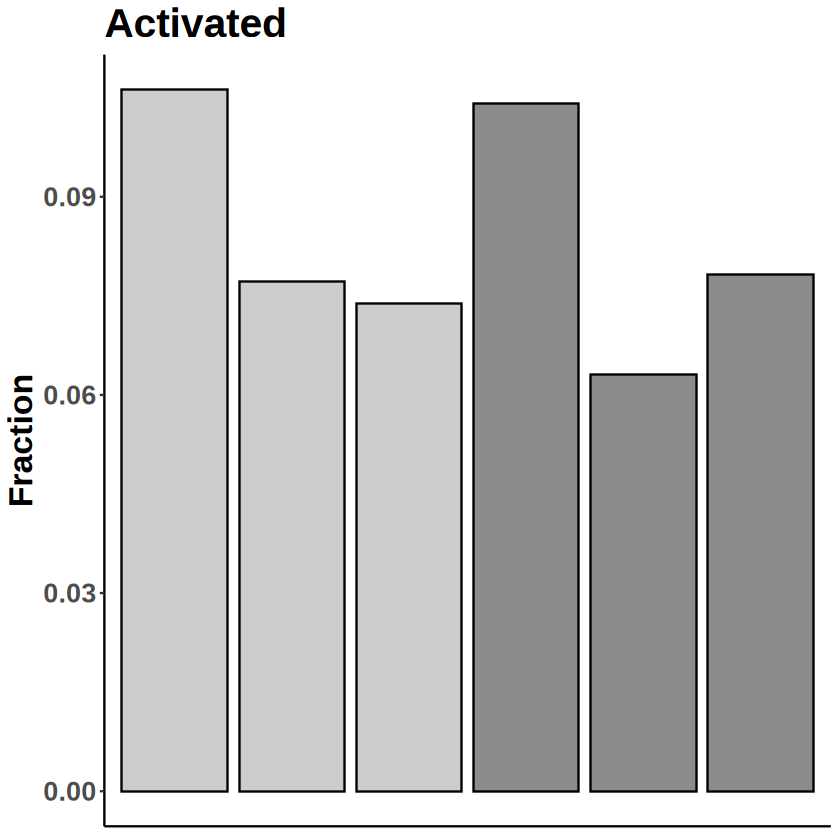

In [2]:
exl_file <- read_excel("/home/a.garg/integration_project/step_14/11march_final/ROSMAP_plot_data.xlsx", sheet = "Sheet4", .name_repair = "minimal")
data <- exl_file[, c(1, 4:5, 7)]
data$Cell_state <- factor(data$Cell_state, levels = c("Homeostatic", "Activated"))
sample <- rep(c(rep("AD-1", 2), rep("AD-2", 2), rep("AD-3", 2)))
data$sample <- sample
data_long <- gather(data, key = "AT8_Type", value = "AT8_Value", `AT8-Level 0`, `AT8-Others`)


# Initialize an empty list to store plots
plots <- list()

# Get unique levels of Cell_state
unique_cell_states <- unique(data$Cell_state)

# Iterate through unique levels of Cell_state
plots <- lapply(seq_along(unique_cell_states), function(x) {
    df <- data_long %>% filter(str_detect(Cell_state, levels(data$Cell_state)[x]))
    df_p_val <- data.frame(
        AT8_Type = c("AT8-Others", "AT8-Others", "AT8-Others"),
        group1 = c("AD-1", "AD-2", "AD-3"),
        group2 = c("AD-1", "AD-2", "AD-3"),
        p.val = signif(df$`AT8-pval`[1:3], digits = 3)
    )
    df_p_val$p.sci <- format(df_p_val$p.val, scientific = TRUE)

# Create a new variable combining AT8_Type and sample
df$sample_AT8 <- factor(paste(df$AT8_Type, df$sample), levels = unique(paste(df$AT8_Type, df$sample)))

# Iterate through unique levels of Cell_state
p <- ggplot(df, aes(x = sample_AT8, y = AT8_Value, fill = AT8_Type)) +
  geom_bar(position = "dodge", stat = "identity", colour = 'black') +
  ggtitle(unique_cell_states[x]) +
 theme_classic()+NoLegend()+
  scale_fill_manual(values = c("#cccccc", "#8c8c8c")) +
  theme(text = element_text(size = 20, face = "bold"),
        axis.text.x = element_text(angle = 45, hjust = 1)) +
  xlab("Samples") +
  ylab("Fraction")+
   theme(axis.title.x=element_blank(),
        axis.text.x=element_blank(),
        axis.ticks.x=element_blank())
plot(p)
plots[[x]] <- p # Store the plot in the list
})


ggsave(plot = plots[[1]],"/home/a.garg/integration_project/step_14/11march_final/Plots/comp_ROSMAP_AT8_2-3layer_samples_hom.pdf",width = 4,height =4,bg ="white")
ggsave(plot = plots[[2]],"/home/a.garg/integration_project/step_14/11march_final/Plots/comp_ROSMAP_AT8_2-3layer_samples_act.pdf",width = 4,height =4,bg ="white")


In [10]:
# read the data
exl_file <- read_excel("/home/a.garg/integration_project/step_14/11march_final/ROSMAP_plot_data.xlsx", sheet = "Sheet4", .name_repair = "minimal")
data <- exl_file[, c(1:3, 6)]
data$Cell_state <- factor(data$Cell_state, levels = c("Homeostatic", "Activated"))
sample <- rep(c(rep("AD-1", 2), rep("AD-2", 2), rep("AD-3", 2)))
data$sample <- sample
data_long <- gather(data, key = "Ab_Type", value = "Ab_Value", `Ab-Level 0`, `Ab-Others`)


# Initialize an empty list to store plots
plots <- list()

# Get unique levels of Cell_state
unique_cell_states <- unique(data$Cell_state)

# Iterate through unique levels of Cell_state
plots <- lapply(seq_along(unique_cell_states), function(x) {
  df <- data_long %>% filter(str_detect(Cell_state, levels(data$Cell_state)[x]))
  df_p_val <- data.frame(
    Ab_Type = c("Ab-Others", "Ab-Others", "Ab-Others"),
    group1 = c("AD-1", "AD-2", "AD-3"),
    group2 = c("AD-1", "AD-2", "AD-3"),
    p.val = signif(as.numeric(df$`Ab-pval`)[1:3], digits = 3)
    
  )
df_p_val$p.sci <- format(df_p_val$p.val, scientific = TRUE)

  p <- ggplot(df, aes(x = sample, y = Ab_Value, fill = Ab_Type)) +
    geom_bar(position = "dodge", stat = "identity", colour = 'black') +
    ggtitle(unique_cell_states[x]) +
    theme_minimal() +
    scale_fill_manual(values = c("#cccccc", "#8c8c8c"))+
    theme(text = element_text(size = 30, face = "bold"),
          axis.text.x = element_text(angle = 45, hjust = 1)) +
    stat_pvalue_manual(df_p_val, label = 'p.sci', y.position = max(df$Ab_Value) + 0.01,size = 6, face ="bold")+ NoLegend()+xlab("Samples")+ylab("Fraction")

  plots[[x]] <- p  # Store the plot in the list
})

ggsave(plot = plots[[1]],"/home/a.garg/integration_project/step_14/11march_final/Plots/ROSMAP_AB_2-3layer_samples_hom.pdf", width = 6,height =7,bg ="white")

ggsave(plot = plots[[2]],"/home/a.garg/integration_project/step_14/11march_final/Plots/ROSMAP_AB_2-3layer_samples_act.pdf", width = 6,height =7,bg ="white")

In [11]:
exl_file <- read_excel("/home/a.garg/integration_project/step_14/11march_final/ROSMAP_plot_data.xlsx", sheet = "Sheet4", .name_repair = "minimal")
data <- exl_file[, c(1, 4:5, 7)]
data$Cell_state <- factor(data$Cell_state, levels = c("Homeostatic", "Activated"))
sample <- rep(c(rep("AD-1", 2), rep("AD-2", 2), rep("AD-3", 2)))
data$sample <- sample
data_long <- gather(data, key = "AT8_Type", value = "AT8_Value", `AT8-Level 0`, `AT8-Others`)


# Initialize an empty list to store plots
plots <- list()

# Get unique levels of Cell_state
unique_cell_states <- unique(data$Cell_state)

# Iterate through unique levels of Cell_state
plots <- lapply(seq_along(unique_cell_states), function(x) {
    df <- data_long %>% filter(str_detect(Cell_state, levels(data$Cell_state)[x]))
    df_p_val <- data.frame(
        AT8_Type = c("AT8-Others", "AT8-Others", "AT8-Others"),
        group1 = c("AD-1", "AD-2", "AD-3"),
        group2 = c("AD-1", "AD-2", "AD-3"),
        p.val = signif(df$`AT8-pval`[1:3], digits = 3)
    )
    df_p_val$p.sci <- format(df_p_val$p.val, scientific = TRUE)

    p <- ggplot(df, aes(x = sample, y = AT8_Value, fill = AT8_Type)) +
        geom_bar(position = "dodge", stat = "identity", colour = "black") +
        ggtitle(unique_cell_states[x]) +
        theme_minimal() +
        scale_fill_manual(values = c("#cccccc", "#8c8c8c")) +
        theme(
            text = element_text(size = 30, face = "bold"),
            axis.text.x = element_text(angle = 45, hjust = 1)
        ) +
        stat_pvalue_manual(df_p_val, label = "p.sci", y.position = max(df$AT8_Value) + 0.01,size = 6, face ="bold")+ NoLegend()+xlab("Samples")+ylab("Fraction")
    plots[[x]] <- p # Store the plot in the list
})


ggsave(plot = plots[[1]],"/home/a.garg/integration_project/step_14/11march_final/Plots/ROSMAP_AT8_2-3layer_samples_hom.pdf", width = 6,height =7,bg ="white")

ggsave(plot = plots[[2]],"/home/a.garg/integration_project/step_14/11march_final/Plots/ROSMAP_AT8_2-3layer_samples_act.pdf",width = 6,height =7,bg ="white")

Cell_state,Layer 2,Layer 3,Layer 4,Layer 5,Layer 6
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Homeostatic,0.2323492,0.09574876,0.07939509,0.30085653,0.33117409
Activated,0.0872914,0.09191881,0.12003781,0.08351178,0.09230769


Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


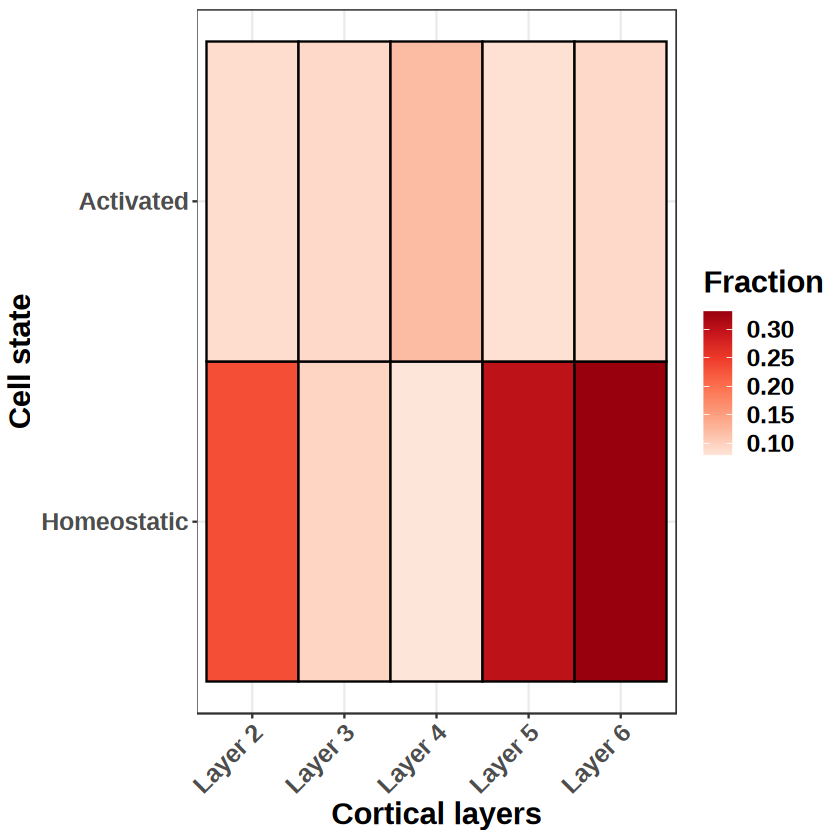

In [12]:
exl_file <- read_excel("/home/a.garg/integration_project/step_14/11march_final/ROSMAP_plot_data.xlsx", sheet = "Sheet5", .name_repair = "minimal")
exl_file

data <- exl_file %>% gather("Layer", "Fraction", -Cell_state)
data$Cell_state <- factor(data$Cell_state, levels = c("Homeostatic", "Activated"))
p <- data %>% ggplot(aes(x = Cell_state , y = Layer, fill = Fraction)) +   geom_tile() +  scale_fill_viridis()+
scale_fill_distiller(palette = "Reds", direction = 1) + 
xlab("Cell state")+ylab("Cortical layers")+ 
#scale_fill_gradient2(low = "white", high = "red") + 
#ggtitle("layers (with top 25%)")+
#coord_fixed()+
coord_flip()+
geom_tile(color = "black", lwd = 0.5)+
theme_bw() + 
#geom_text(aes(label = round(Fraction, digits = 3)))+ 
  theme(text = element_text(size = 18, face = "bold"))
p <- p+theme(axis.text.x = element_text(angle = 45, hjust = 1))
#pdf("heatmap.pdf", height = 6, width = 6)
ggsave("/home/a.garg/integration_project/step_14/11march_final/Plots/ROSMAP_fact_layers_heatmap.pdf", width = 6,height = 2.5)
plot(p)